In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np

from mopet import mopet

from synchronization import plots
from synchronization import runner
from synchronization import constants

# PING Model with Sparse Connectivity

## Default Parameters

In [2]:
params = {
    "runtime": 500.0,

    "J_itoi": 0.7,
    "J_etoe": 0.01,
    "J_etoi": 0.05,
    "J_itoe": 0.5,

    # increased from 0.003 to 0.01
    "J_ppee": 0.01,
    "J_ppei": 0.03,

    # increased from 0 to 0.1, have to run explorations again!
    "p_ppee": 0.1,
    "p_ppei": 0.4,
    "p_ppii": 0.0,
    
    "p_etoi": 0.4,
    "p_etoe": 0.2,
    "p_itoe": 0.4,
    "p_itoi": 0.4,

    "ou_enabled": [False, False],

    "poisson_enabled": [True, True],
    "poisson_variance": 1.0,
    "poisson_p": 0.84,
    "poisson_size": 800,
    "poisson_mean_input": 300,
    
    "N_pop": 2,
    
    "net_record_spikes": 400,
    "poisson_I_ratio": 0.4,
    "poisson_I_enabled": True,
     "const_delay": 0.0,
}

## Fine Tuning

In [9]:
params_mid = dict(params)
params_mid.update({
    "runtime": 1000,
    "poisson_variance": 1.0,
})

low_strength = runner.run(
    modified_params=params_mid
)

Starting simulation at t=0. s for a duration of 1. s
1. s (100%) simulated in 8s


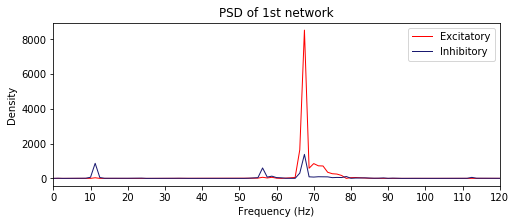

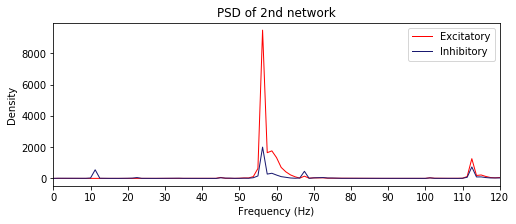

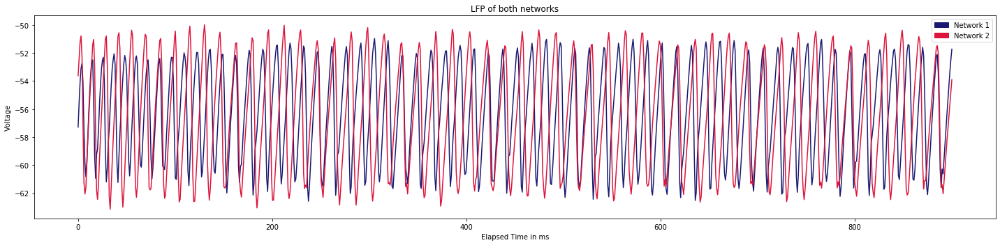

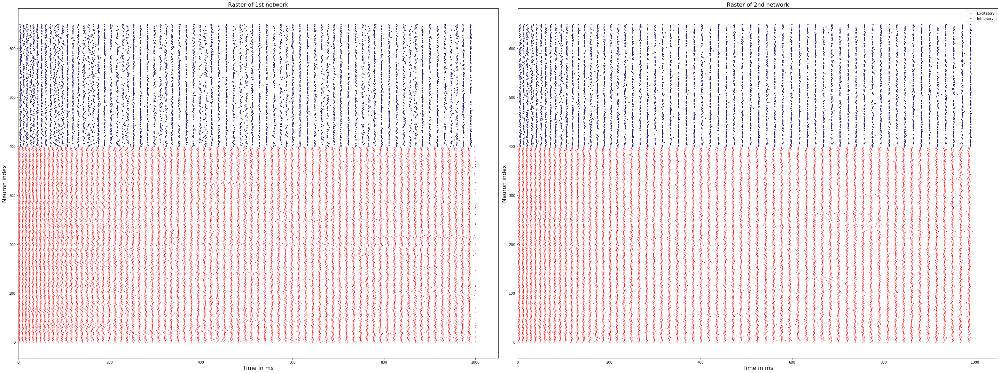

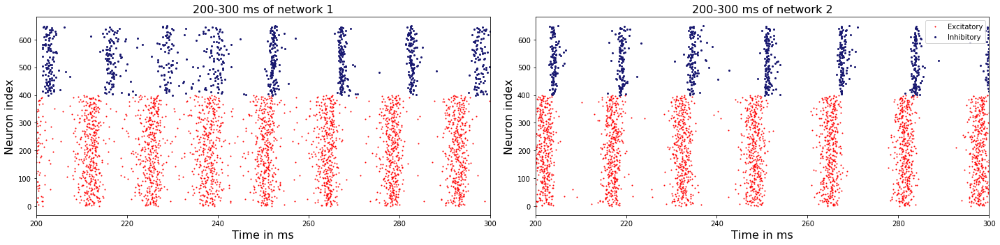

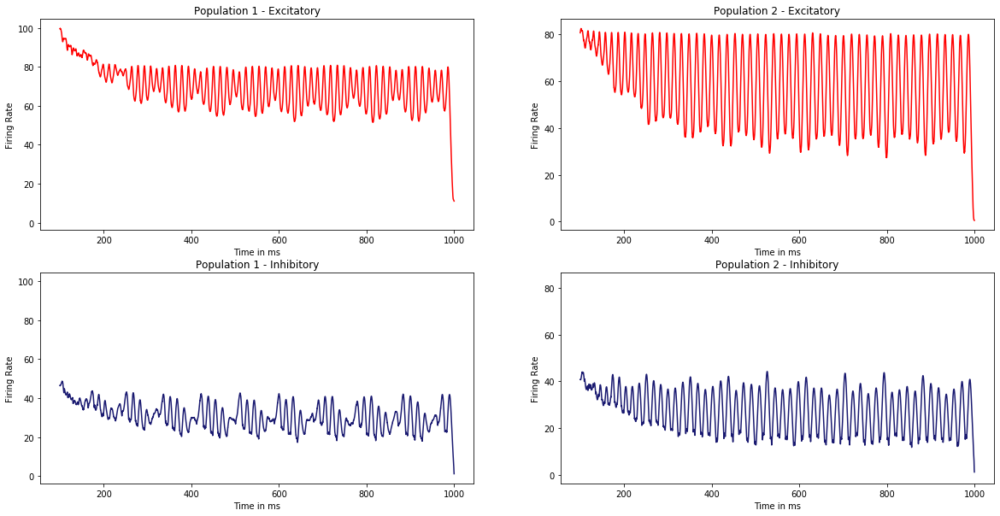

In [10]:
plots.plot_results(low_strength, pop_rates=True, full_raster=True)

In [11]:
params_mid = dict(params)
params_mid.update({
    "runtime": 1000,
    "poisson_variance": 4.5,
#    "J_ppei": 0.03,
#    "J_itoi": 0.7,
#    "J_itoe": 0.5,
})

low_strength = runner.run(
    modified_params=params_mid
)

Starting simulation at t=0. s for a duration of 1. s
1. s (100%) simulated in 8s


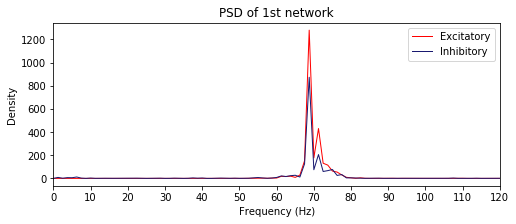

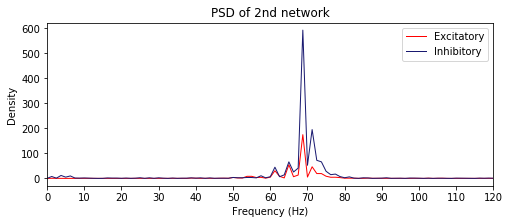

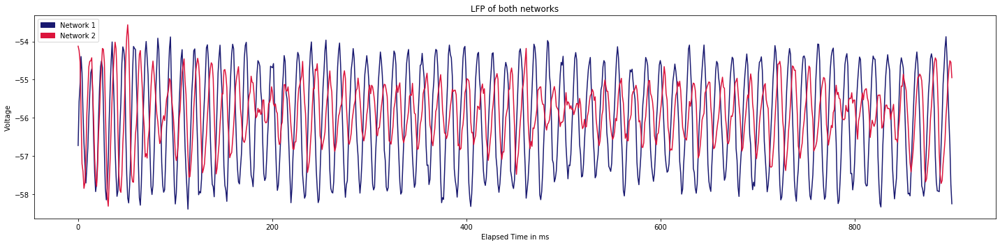

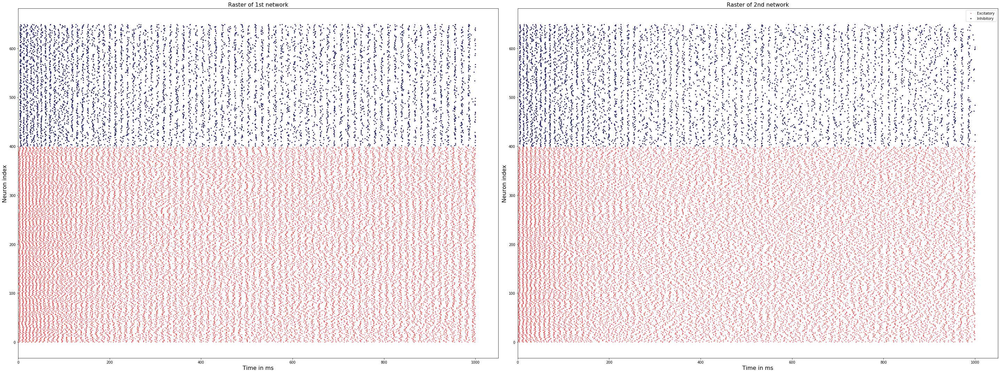

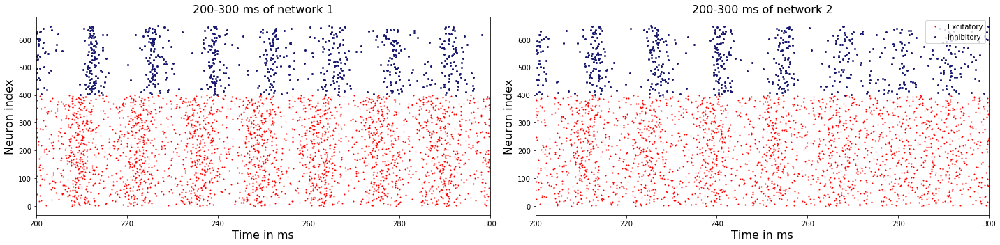

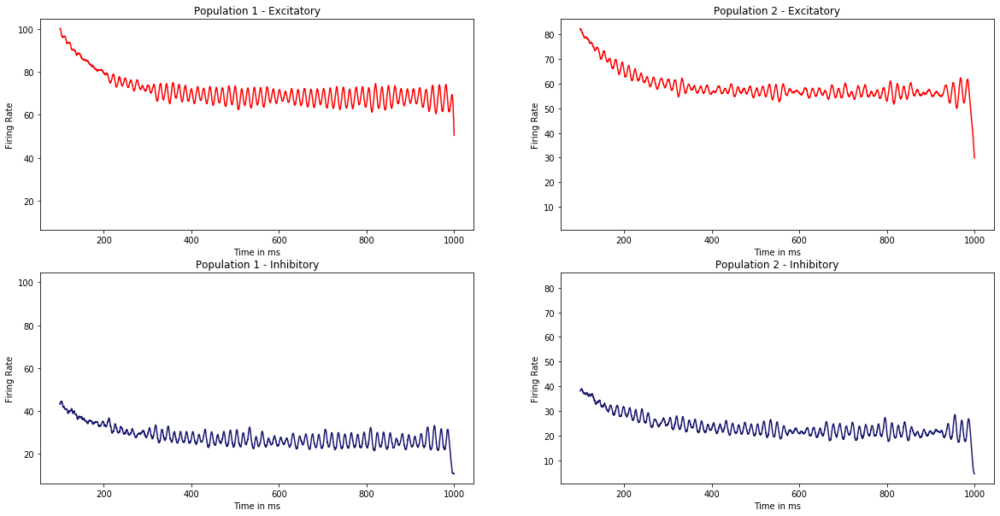

In [12]:
plots.plot_results(low_strength, pop_rates=True, full_raster=True)

## Low Noise and Low Coupling

In [105]:
params_mid = dict(params)
params_mid.update({
    "runtime": 5000,
    "poisson_variance": 0.7,
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_sparse_base",
    load=True
)

Global Order Parameter value of: 0.5948302123098
Mean Phase Coherence 0.12164254531299691
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.5682241455210141
Within Synchronization of Network 2 0.6564684852977181


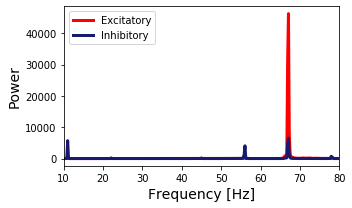

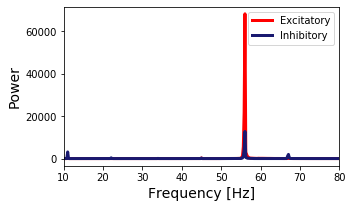

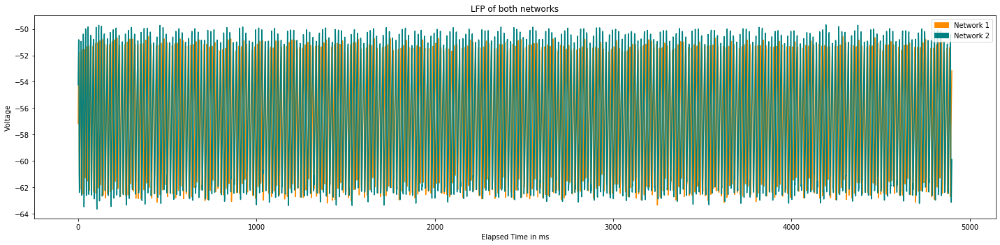

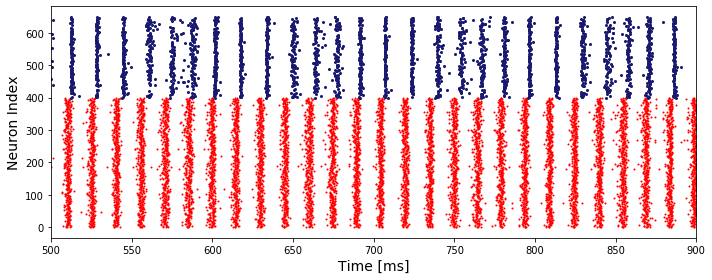

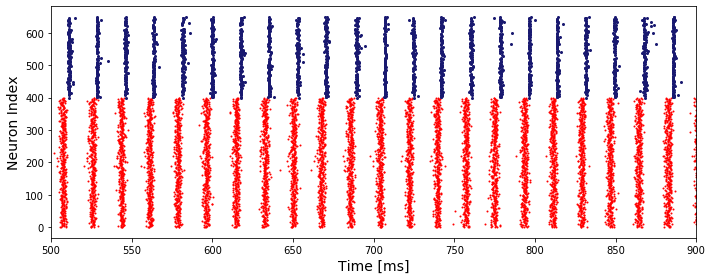

...

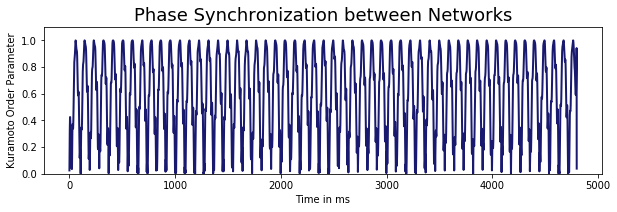

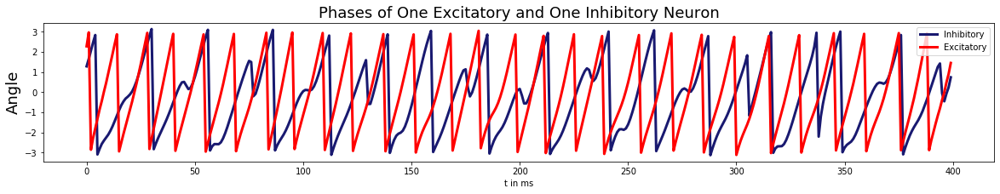

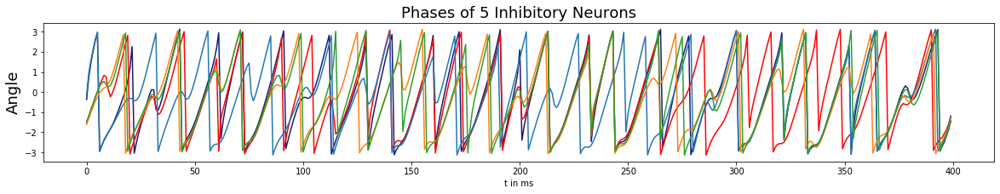

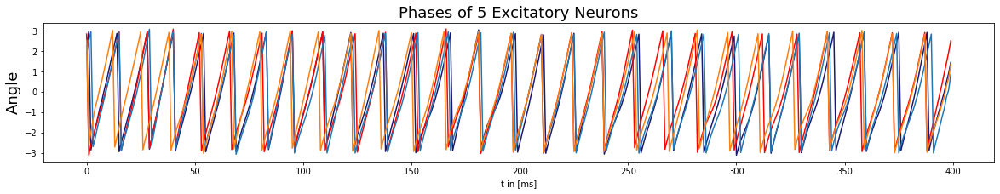

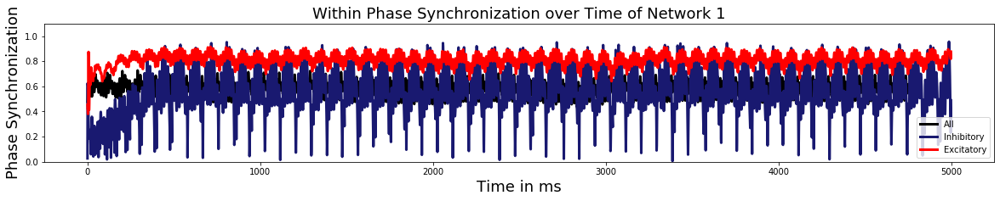

In [56]:
plots.plot_results(model, pop_rates=True, full_raster=False, folder="PING_weak_noise", x_max_psd=80, phase_analysis=True, save=True)

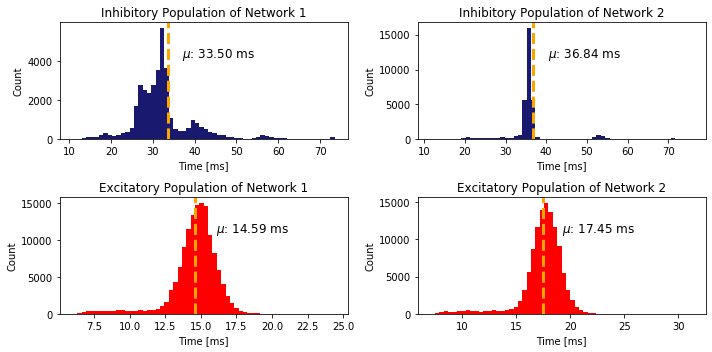

In [106]:
plots.isi_histograms(model, filter_outlier=True, folder="PING", key="normal")

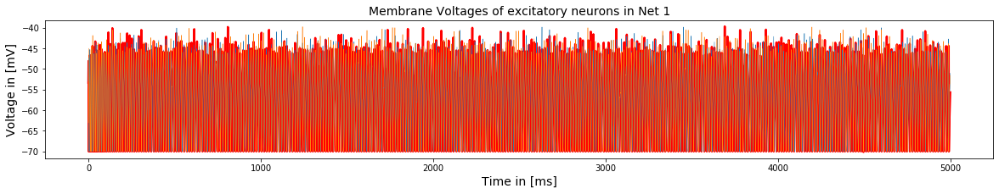

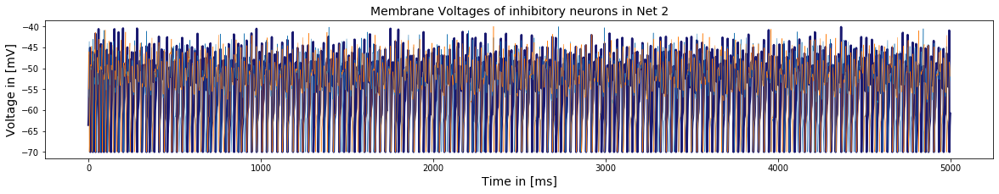

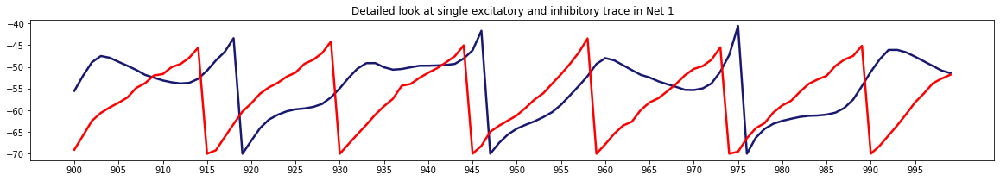

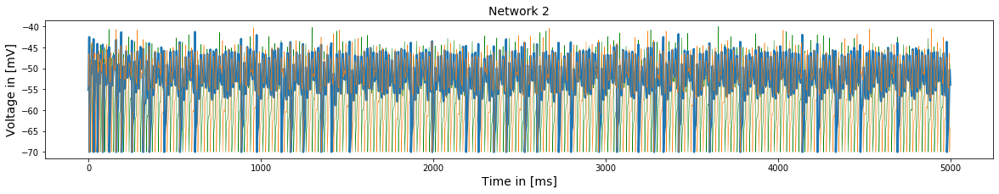

In [6]:
plots.membrane_potentials_sample(model)

1
249


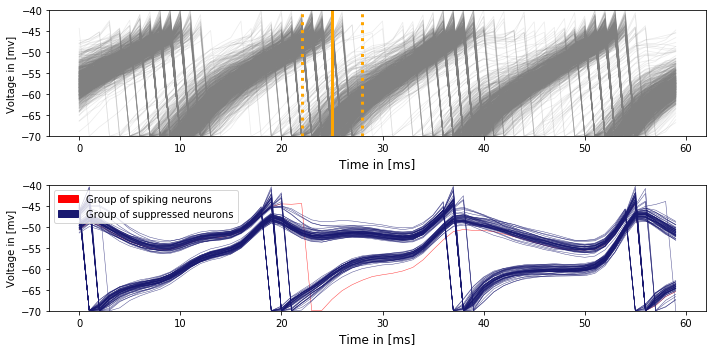

In [78]:
window=(920, 980)

v_e = model["v_all_neurons_e"]
v2 = model["v_all_neurons_i2"]

plots.spike_variability_analysis(v_e, v2, window=window, t_s=945, t_width=(3, 3), folder="PING", key="normal")

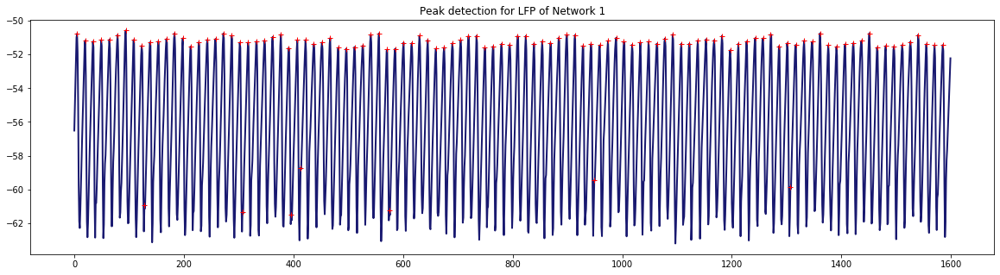

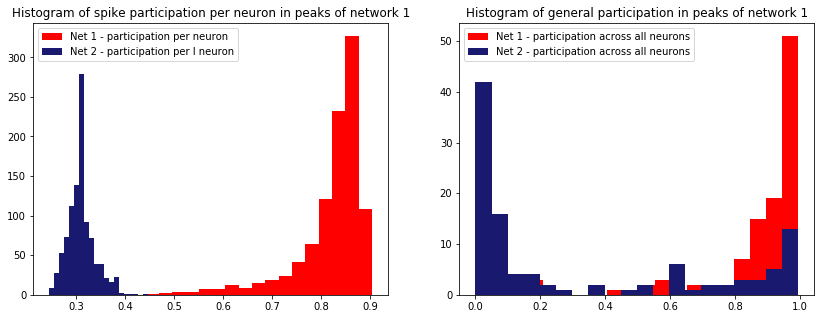

In [4]:
plots.spike_participation_histograms(model)

## Increased coupling strength leads to synchronization

In [107]:
params_mid = dict(params)
params_mid.update({
    "runtime": 2000,
    "poisson_variance": 0.7,
    "J_ppei": 0.07,
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_coupling",
    load=True
)

Global Order Parameter value of: 0.8318801919036671
Mean Phase Coherence 0.9509353290743239
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.6178042132973811
Within Synchronization of Network 2 0.5719865795232006


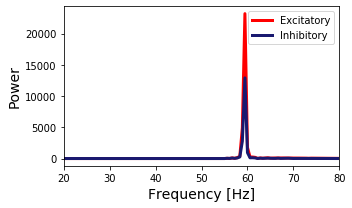

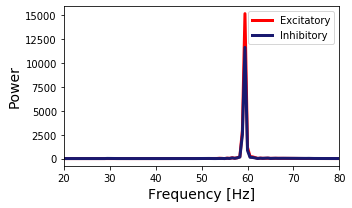

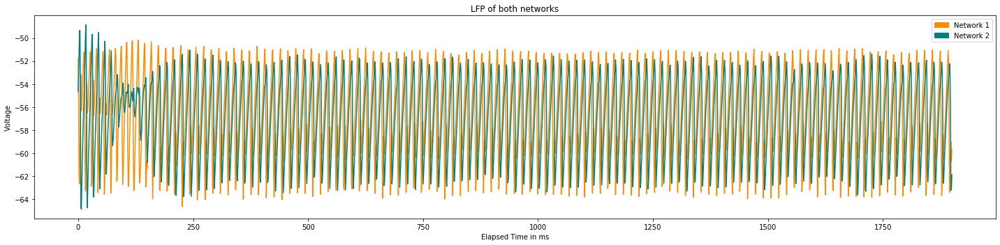

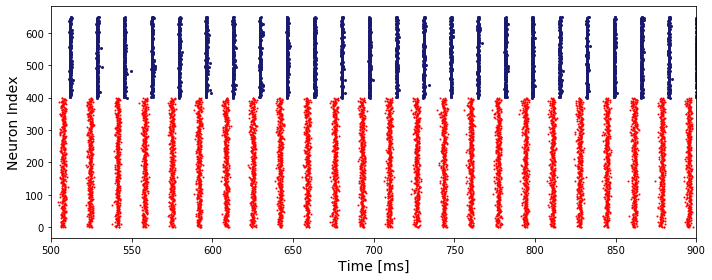

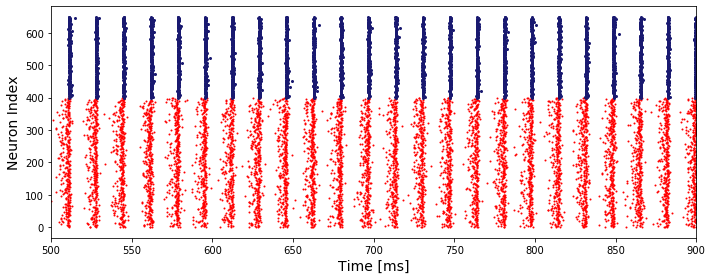

...

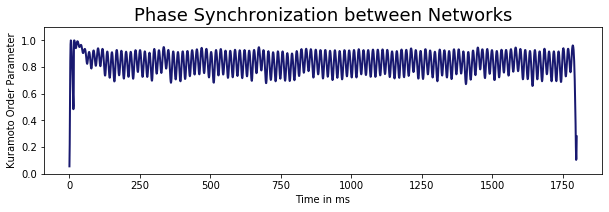

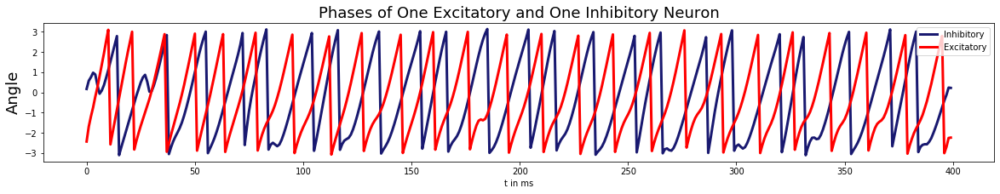

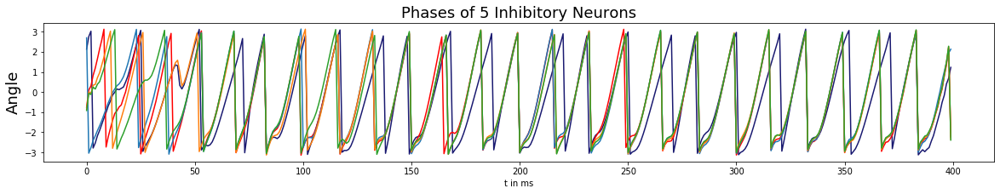

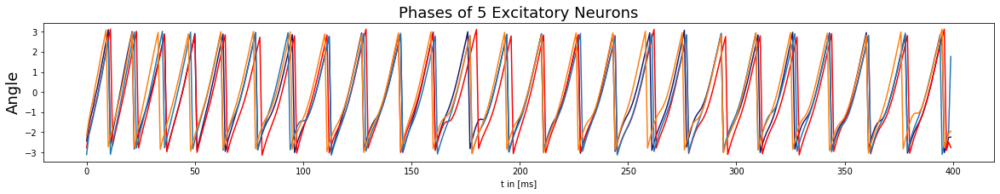

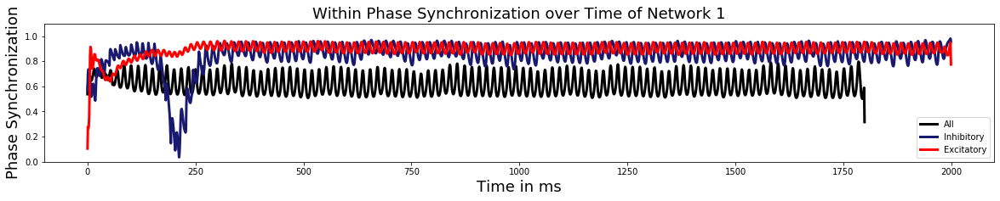

In [60]:
plots.plot_results(model, pop_rates=True, x_min_psd=20 ,x_max_psd=80, full_raster=False, phase_analysis=True, folder="PING_strong_coupling", save=True)

208
42


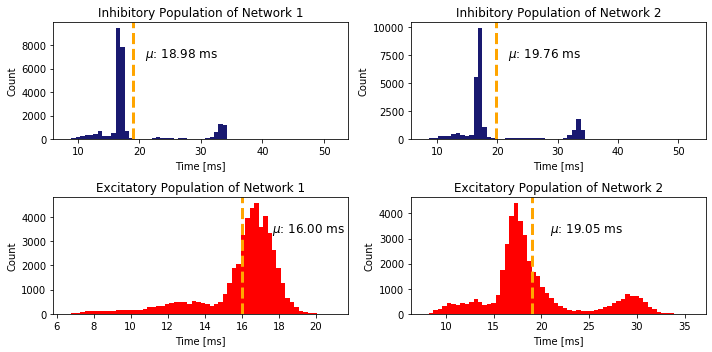

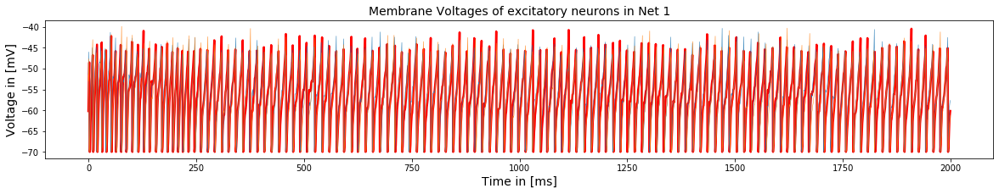

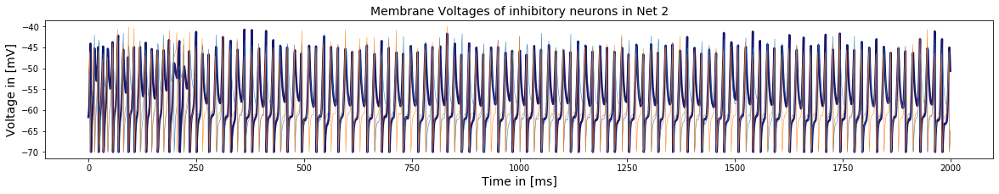

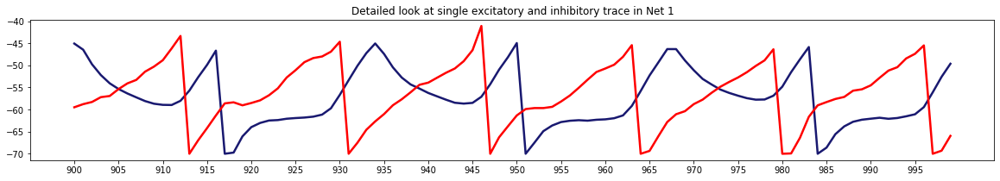

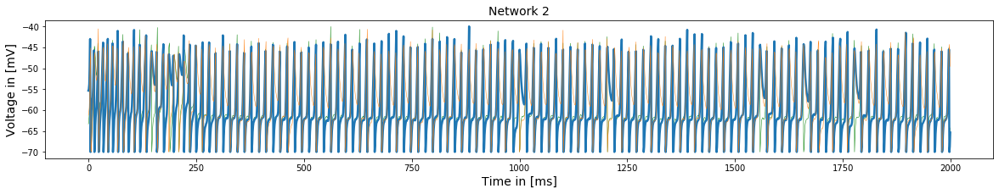

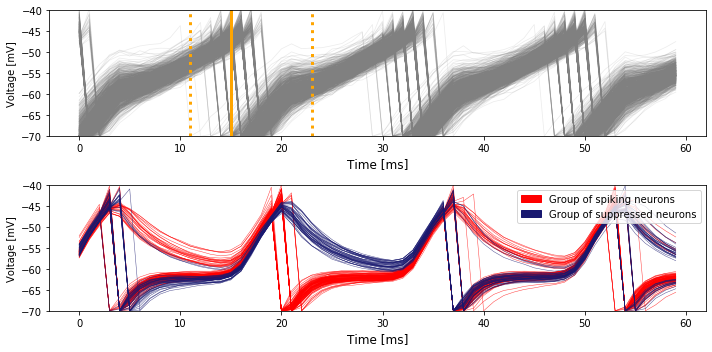

In [100]:
plots.isi_histograms(model, filter_outlier=True, folder="PING", key="coupling-synch")
plots.membrane_potentials_sample(model)

window=(930, 990)

v_e = model["v_all_neurons_e"]
v2 = model["v_all_neurons_i2"]

plots.spike_variability_analysis(v_e, v2, window=window, t_s=945, t_width=(4, 8), folder="PING", key="coupling-synch")

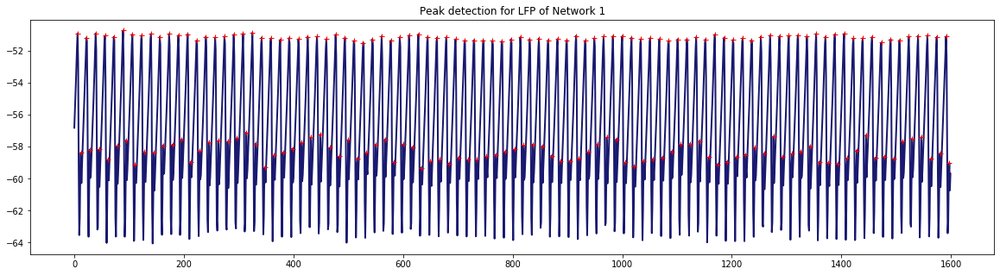

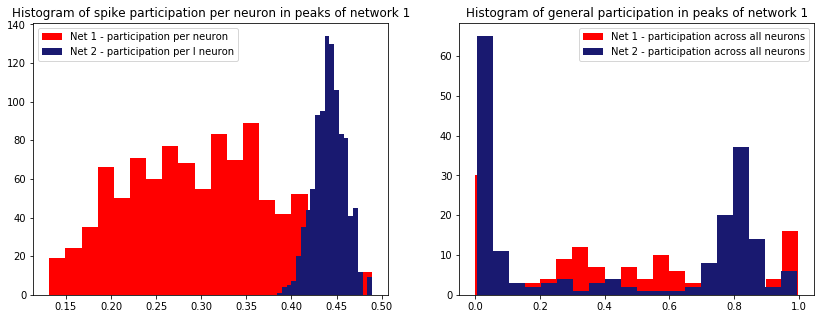

In [6]:
plots.spike_participation_histograms(model)

## Increased noise leads to synchronization

In [103]:
params_mid = dict(params)
params_mid.update({
    "runtime": 5000,
    "poisson_variance": 4.5,
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_sparse_noise_synch",
    load=True
)

Global Order Parameter value of: 0.6131537815207315
Mean Phase Coherence 0.6852825651175136
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.18168871193440628
Within Synchronization of Network 2 0.18038619891125668


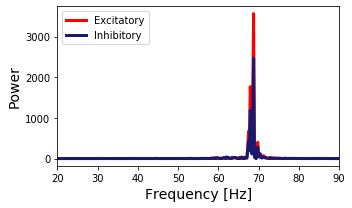

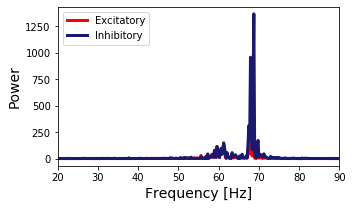

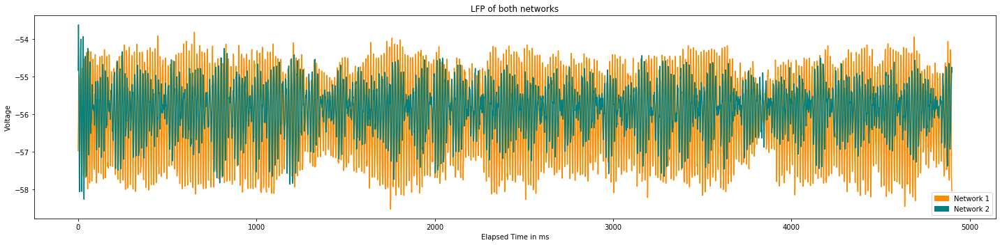

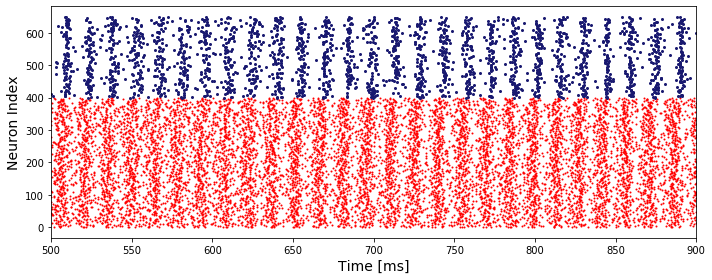

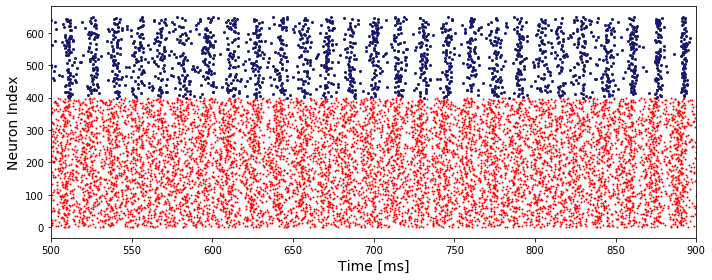

...

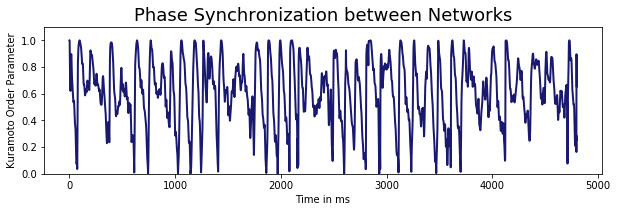

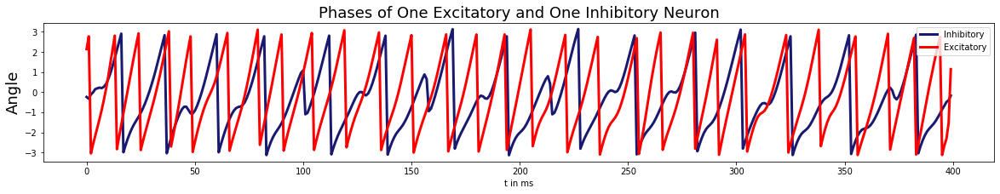

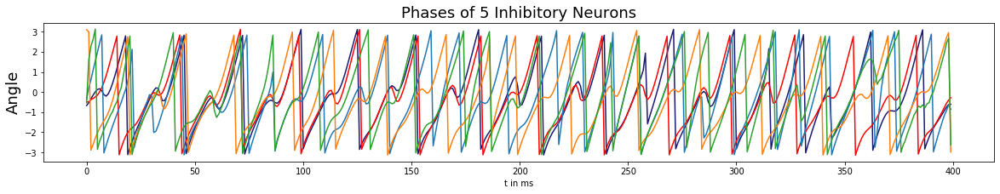

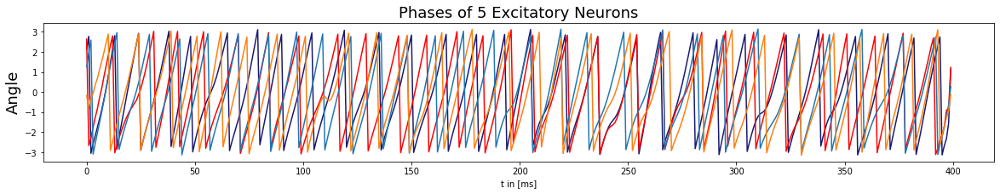

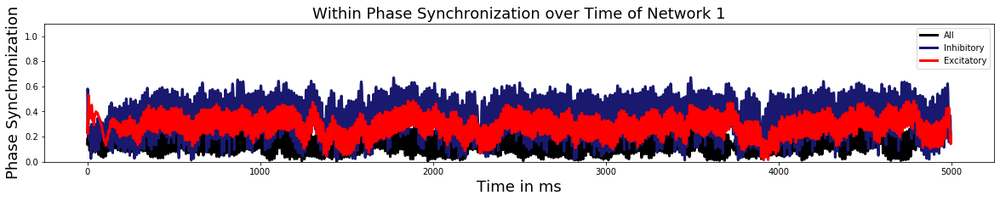

In [58]:
plots.plot_results(model, pop_rates=True, x_min_psd=20, x_max_psd=90, full_raster=False, phase_analysis=True, folder="PING_strong_noise", save=True)

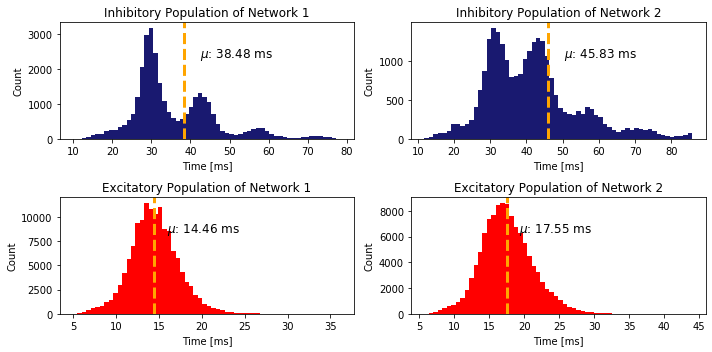

In [104]:
plots.isi_histograms(model, filter_outlier=True, folder="PING", key="noise-synch")

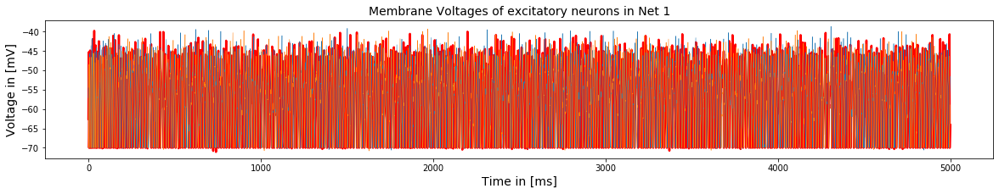

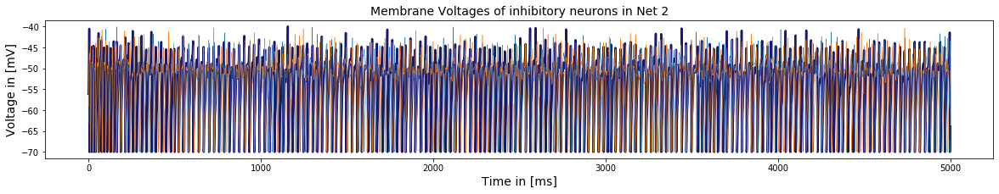

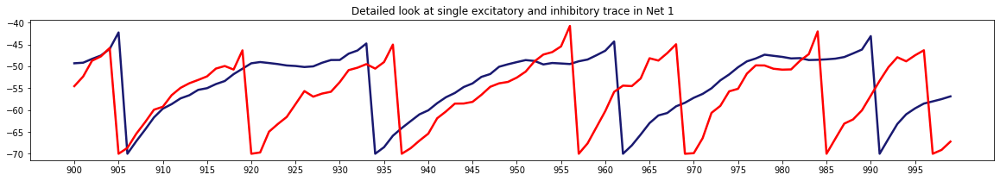

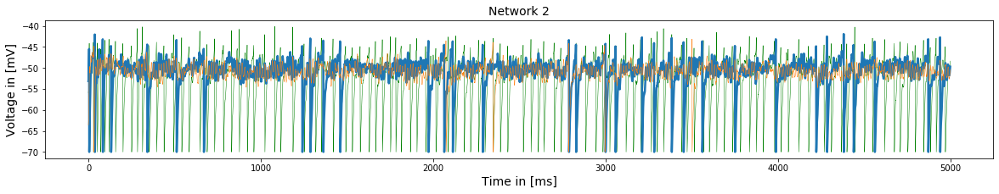

In [24]:
plots.membrane_potentials_sample(model)

72
178


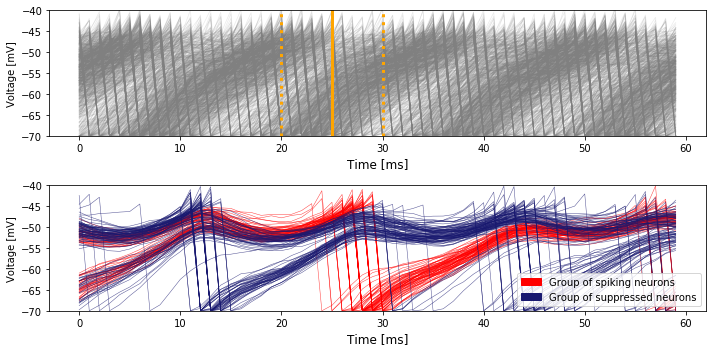

In [84]:
window=(880, 940)

v_e = model["v_all_neurons_e"]
v2 = model["v_all_neurons_i2"]

plots.spike_variability_analysis(v_e, v2, window=window, t_s=905, t_width=(5, 5), folder="PING", key="noise-synch")

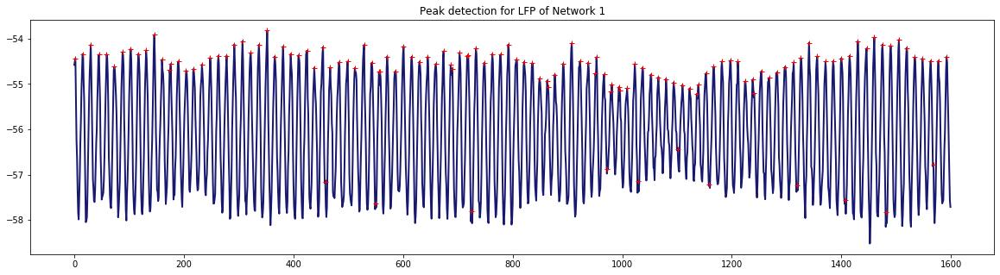

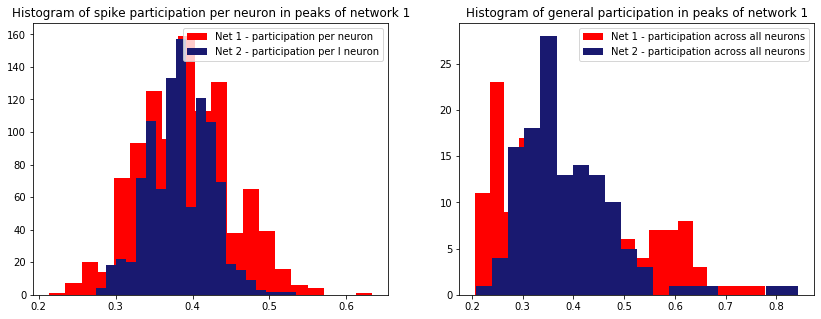

In [8]:
plots.spike_participation_histograms(model)

## Strong Noise and Strong Coupling

* Synchronized, but noisy

In [3]:
params_mid = dict(params)
params_mid.update({
    "runtime": 5000,
    "poisson_variance": 4.5,
    "J_ppei": 0.07,
})

model = runner.run(
    modified_params=params_mid,
    file_name="PING_sparse_str_coupling_str_noise",
    load=False
)

Starting simulation at t=0. s for a duration of 5. s
1.15935 s (23%) simulated in 10s, estimated 33s remaining.
2.34 s (46%) simulated in 20s, estimated 23s remaining.
3.4983 s (69%) simulated in 30s, estimated 13s remaining.
4.67545 s (93%) simulated in 40s, estimated 3s remaining.
5. s (100%) simulated in 42s


Global Order Parameter value of: 0.6131537815207315
Mean Phase Coherence 0.6852825651175136
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.18168871193440628
Within Synchronization of Network 2 0.18038619891125668


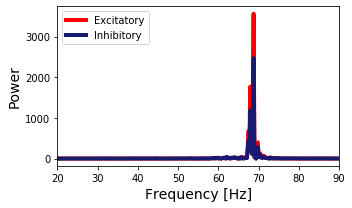

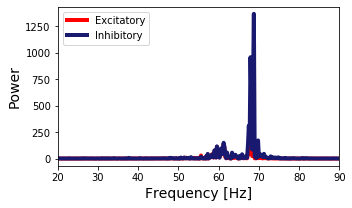

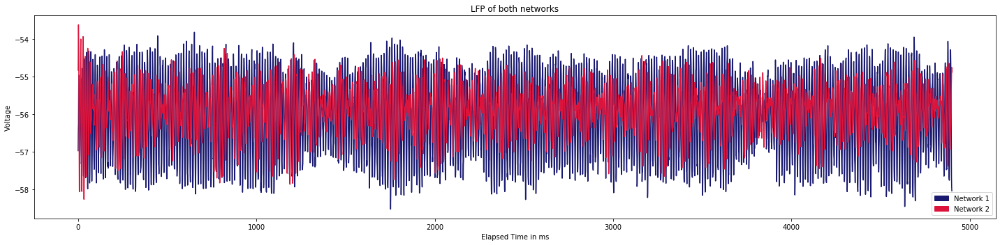

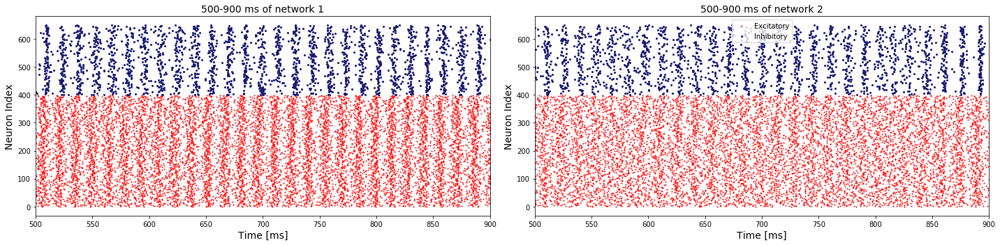

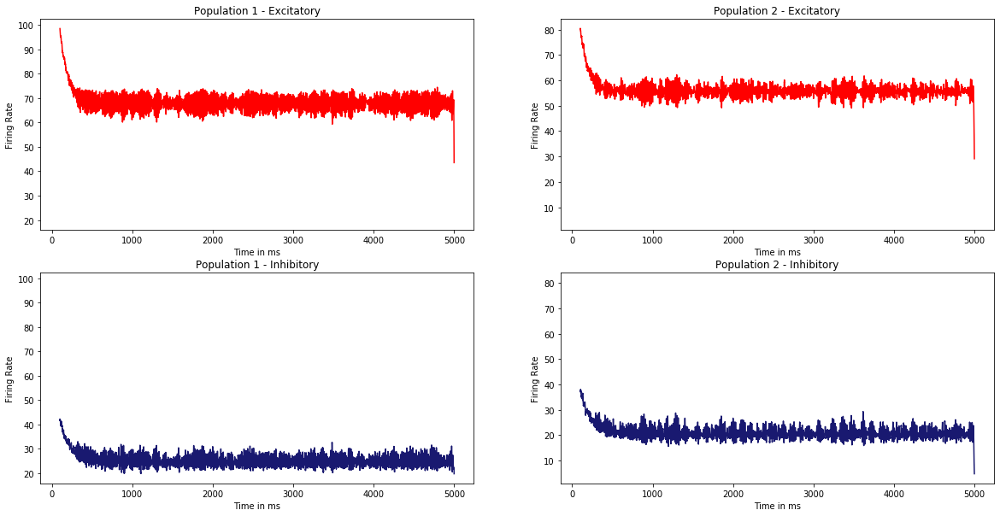

...

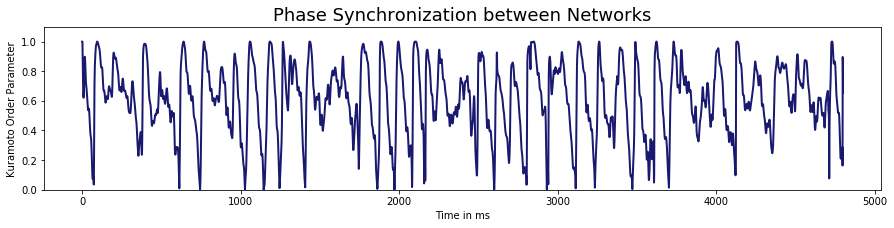

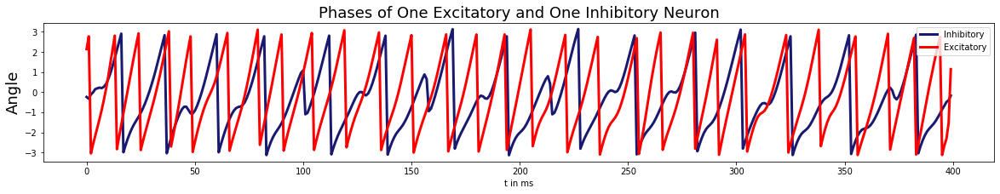

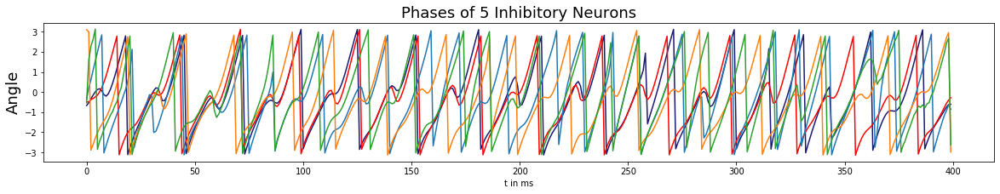

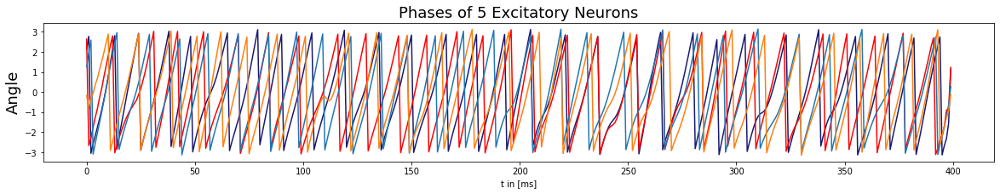

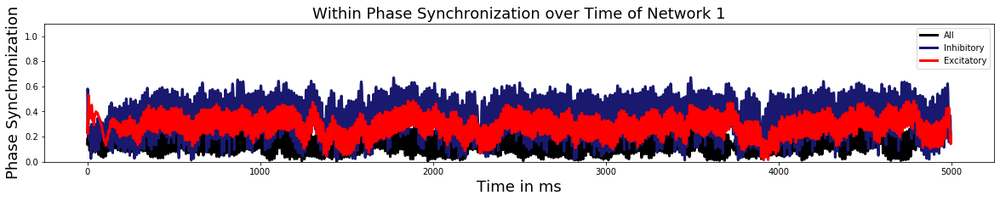

In [31]:
plots.plot_results(model, pop_rates=True, x_min_psd=20, x_max_psd=90, full_raster=False, phase_analysis=True, folder="PING_strong_coupling_strong_noise", save=True)

# Explorations

## Single Param Exploration

* too much excitation if strength is high

In [3]:
exp_params = {
    "poisson_variance": np.arange(1.0, 8.0, 0.1),
}

ov_params = dict(params)
ov_params.update({
     "runtime": 1000.0,
})

ex = mopet.Exploration(
    runner.run_in_mopet, 
    explore_params=exp_params, 
    default_params=ov_params,
    hdf_filename=constants.MODELS_PATH + "/PING_sparse.h5",
    exploration_name="exp_2"
)

In [222]:
ex.run()

2020-07-23 11:15:07,226	INFO resource_spec.py:212 -- Starting Ray with 9.03 GiB memory available for workers and up to 4.53 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-07-23 11:15:07,476	WARNING services.py:923 -- Redis failed to start, retrying now.
2020-07-23 11:15:07,645	INFO services.py:1165 -- View the Ray dashboard at localhost:8265
INFO:root:Starting 70 jobs.
100%|██████████| 70/70 [00:00<00:00, 521.19it/s]
INFO:root:Runs took 0.13724493980407715 s to submit.
  0%|          | 0/70 [00:00<?, ?it/s]

(pid=7057) Starting simulation at t=0. s for a duration of 1. s
(pid=7057) 0.84275 s (84%) simulated in 10s, estimated 2s remaining.
(pid=7057) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=7057) 1. s (100%) simulated in 11s
(pid=7057) Starting simulation at t=0. s for a duration of 1. s
(pid=7051) Starting simulation at t=0. s for a duration of 1. s
(pid=7056) Starting simulation at t=0. s for a duration of 1. s
(pid=7052) Starting simulation at t=0. s for a duration of 1. s
(pid=7057) 0.76315 s (76%) simulated in 10s, estimated 3s remaining.
(pid=7049) Starting simulation at t=0. s for a duration of 1. s
(pid=7047) Starting simulation at t=0. s for a duration of 1. s
(pid=7048) Starting simulation at t=0. s for a duration of 1. s
(pid=7057) 1. s (100%) simulated in 14s
(pid=7054) Starting simulation at t=0. s for a duration of 1. s
(pid=7050) Starting simulation at t=0. s for a duration of 1. s
(pid=7051) 0.4888 s (48%) simulated 

  1%|▏         | 1/70 [01:01<1:10:20, 61.17s/it]

(pid=7050) 0.7881 s (78%) simulated in 20s, estimated 5s remaining.
(pid=7051) Starting simulation at t=0. s for a duration of 1. s
(pid=7046) 0.79145 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7053) 0.7859 s (78%) simulated in 20s, estimated 5s remaining.
(pid=7052) Starting simulation at t=0. s for a duration of 1. s
(pid=7054) 1. s (100%) simulated in 25s
(pid=7054) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]


  3%|▎         | 2/70 [01:05<49:56, 44.06s/it]  

(pid=7055) 0.7845 s (78%) simulated in 20s, estimated 5s remaining.
(pid=7049) Starting simulation at t=0. s for a duration of 1. s
(pid=7050) 1. s (100%) simulated in 25s
(pid=7050) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=7047) Starting simulation at t=0. s for a duration of 1. s
(pid=7046) 1. s (100%) simulated in 25s
(pid=7046) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=7053) 1. s (100%) simulated in 25s
(pid=7053) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]


  4%|▍         | 3/70 [01:09<35:56, 32.18s/it]

(pid=7057) 0.376 s (37%) simulated in 10s, estimated 17s remaining.


  7%|▋         | 5/70 [01:10<17:11, 15.87s/it]

(pid=7055) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=7055) 1. s (100%) simulated in 25s


  9%|▊         | 6/70 [01:12<12:30, 11.73s/it]

(pid=7051) 0.3754 s (37%) simulated in 10s, estimated 17s remaining.


 10%|█         | 7/70 [01:13<09:01,  8.59s/it]

(pid=7052) 0.3733 s (37%) simulated in 10s, estimated 17s remaining.


 17%|█▋        | 12/70 [01:16<01:42,  1.76s/it]

(pid=7049) 0.3677 s (36%) simulated in 10s, estimated 17s remaining.


 19%|█▊        | 13/70 [01:16<01:14,  1.30s/it]

(pid=7056) Starting simulation at t=0. s for a duration of 1. s
(pid=7047) 0.36845 s (36%) simulated in 10s, estimated 17s remaining.
(pid=7057) 0.7556 s (75%) simulated in 20s, estimated 6s remaining.
(pid=7051) 0.7759 s (77%) simulated in 20s, estimated 6s remaining.
(pid=7048) Starting simulation at t=0. s for a duration of 1. s
(pid=7054) Starting simulation at t=0. s for a duration of 1. s
(pid=7052) 0.783 s (78%) simulated in 20s, estimated 6s remaining.
(pid=7057) 1. s (100%) simulated in 25s
(pid=7049) 0.78375 s (78%) simulated in 20s, estimated 6s remaining.
(pid=7056) 0.42255 s (42%) simulated in 10s, estimated 14s remaining.
(pid=7051) 1. s (100%) simulated in 25s
(pid=7047) 0.79445 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7050) Starting simulation at t=0. s for a duration of 1. s
(pid=7046) Starting simulation at t=0. s for a duration of 1. s


 20%|██        | 14/70 [01:30<04:32,  4.86s/it]

(pid=7052) 1. s (100%) simulated in 25s
(pid=7053) Starting simulation at t=0. s for a duration of 1. s


 21%|██▏       | 15/70 [01:32<03:43,  4.07s/it]

(pid=7049) 1. s (100%) simulated in 25s
(pid=7048) 0.39735 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7055) Starting simulation at t=0. s for a duration of 1. s
(pid=7047) 1. s (100%) simulated in 25s
(pid=7054) 0.39965 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7051) Starting simulation at t=0. s for a duration of 1. s
(pid=7056) 0.8167 s (81%) simulated in 20s, estimated 4s remaining.
(pid=7052) Starting simulation at t=0. s for a duration of 1. s
(pid=7050) 0.3847 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7049) Starting simulation at t=0. s for a duration of 1. s
(pid=7046) 0.38105 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7056) 1. s (100%) simulated in 24s
(pid=7053) 0.3753 s (37%) simulated in 10s, estimated 17s remaining.
(pid=7048) 0.78765 s (78%) simulated in 20s, estimated 5s remaining.
(pid=7055) 0.3887 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7057) Starting simulation at t=0. s for a duration of 1. s
(pid=7

 27%|██▋       | 19/70 [01:46<02:07,  2.50s/it]

(pid=7052) 0.3961 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7048) 1. s (100%) simulated in 25s
(pid=7056) Starting simulation at t=0. s for a duration of 1. s
(pid=7054) 1. s (100%) simulated in 24s
(pid=7050) 0.79495 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7049) 0.3995 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7046) 0.78505 s (78%) simulated in 20s, estimated 5s remaining.
(pid=7053) 0.77685 s (77%) simulated in 20s, estimated 6s remaining.


 30%|███       | 21/70 [01:52<02:07,  2.60s/it]

(pid=7055) 0.79805 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7057) 0.4008 s (40%) simulated in 10s, estimated 15s remaining.
(pid=7050) 1. s (100%) simulated in 24s
(pid=7048) Starting simulation at t=0. s for a duration of 1. s
(pid=7051) 0.8076 s (80%) simulated in 20s, estimated 5s remaining.
(pid=7046) 1. s (100%) simulated in 25s
(pid=7054) Starting simulation at t=0. s for a duration of 1. s
(pid=7047) Starting simulation at t=0. s for a duration of 1. s
(pid=7053) 1. s (100%) simulated in 25s
(pid=7055) 1. s (100%) simulated in 24s
(pid=7052) 0.80635 s (80%) simulated in 20s, estimated 5s remaining.


 31%|███▏      | 22/70 [01:57<02:41,  3.36s/it]

(pid=7056) 0.4165 s (41%) simulated in 10s, estimated 14s remaining.


 33%|███▎      | 23/70 [01:59<02:07,  2.72s/it]

(pid=7049) 0.8083 s (80%) simulated in 20s, estimated 5s remaining.
(pid=7051) 1. s (100%) simulated in 24s


 36%|███▌      | 25/70 [02:01<01:27,  1.95s/it]

(pid=7052) 1. s (100%) simulated in 24s
(pid=7057) 0.80745 s (80%) simulated in 20s, estimated 5s remaining.
(pid=7049) 1. s (100%) simulated in 24s
(pid=7048) 0.4049 s (40%) simulated in 10s, estimated 15s remaining.
(pid=7054) 0.3976 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7047) 0.39595 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7057) 1. s (100%) simulated in 25s
(pid=7056) 0.81815 s (81%) simulated in 20s, estimated 4s remaining.
(pid=7049) Starting simulation at t=0. s for a duration of 1. s


 40%|████      | 28/70 [02:12<01:37,  2.32s/it]

(pid=7056) 1. s (100%) simulated in 24s


 41%|████▏     | 29/70 [02:13<01:09,  1.69s/it]

(pid=7048) 0.7846 s (78%) simulated in 20s, estimated 5s remaining.
(pid=7054) 0.7788 s (77%) simulated in 20s, estimated 6s remaining.
(pid=7050) Starting simulation at t=0. s for a duration of 1. s
(pid=7047) 0.7688 s (76%) simulated in 20s, estimated 6s remaining.
(pid=7046) Starting simulation at t=0. s for a duration of 1. s
(pid=7048) 1. s (100%) simulated in 25s
(pid=7054) 1. s (100%) simulated in 25s
(pid=7047) 1. s (100%) simulated in 25s
(pid=7053) Starting simulation at t=0. s for a duration of 1. s
(pid=7049) 0.3832 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7055) Starting simulation at t=0. s for a duration of 1. s
(pid=7051) Starting simulation at t=0. s for a duration of 1. s


 43%|████▎     | 30/70 [02:25<03:16,  4.92s/it]

(pid=7050) 0.41155 s (41%) simulated in 10s, estimated 14s remaining.


 47%|████▋     | 33/70 [02:26<01:07,  1.81s/it]

(pid=7052) Starting simulation at t=0. s for a duration of 1. s
(pid=7046) 0.38515 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7053) 0.36045 s (36%) simulated in 10s, estimated 18s remaining.
(pid=7049) 0.75545 s (75%) simulated in 20s, estimated 6s remaining.
(pid=7055) 0.36905 s (36%) simulated in 10s, estimated 17s remaining.
(pid=7057) Starting simulation at t=0. s for a duration of 1. s
(pid=7051) 0.3487 s (34%) simulated in 10s, estimated 19s remaining.
(pid=7050) 0.76305 s (76%) simulated in 20s, estimated 6s remaining.
(pid=7056) Starting simulation at t=0. s for a duration of 1. s
(pid=7052) 0.3384 s (33%) simulated in 10s, estimated 20s remaining.
(pid=7049) 1. s (100%) simulated in 26s
(pid=7046) 0.73325 s (73%) simulated in 20s, estimated 7s remaining.
(pid=7053) 0.7213 s (72%) simulated in 20s, estimated 8s remaining.
(pid=7055) 0.73595 s (73%) simulated in 20s, estimated 7s remaining.
(pid=7050) 1. s (100%) simulated in 26s
(pid=7048) Starting simulation at t=

 49%|████▊     | 34/70 [02:46<04:26,  7.40s/it]

(pid=7052) 0.71815 s (71%) simulated in 20s, estimated 8s remaining.
(pid=7055) 1. s (100%) simulated in 26s
(pid=7053) 1. s (100%) simulated in 27s


 50%|█████     | 35/70 [02:50<03:41,  6.34s/it]

(pid=7051) 1. s (100%) simulated in 27s
(pid=7048) 0.3836 s (38%) simulated in 10s, estimated 16s remaining.


 53%|█████▎    | 37/70 [02:53<02:03,  3.75s/it]

(pid=7057) 0.757 s (75%) simulated in 20s, estimated 6s remaining.
(pid=7054) 0.38405 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7052) 1. s (100%) simulated in 27s
(pid=7047) 0.3851 s (38%) simulated in 10s, estimated 16s remaining.


 54%|█████▍    | 38/70 [02:56<01:50,  3.45s/it]

(pid=7056) 0.7851 s (78%) simulated in 20s, estimated 5s remaining.


 57%|█████▋    | 40/70 [02:59<01:10,  2.36s/it]

(pid=7049) Starting simulation at t=0. s for a duration of 1. s
(pid=7057) 1. s (100%) simulated in 26s
(pid=7050) Starting simulation at t=0. s for a duration of 1. s
(pid=7056) 1. s (100%) simulated in 25s
(pid=7048) 0.77235 s (77%) simulated in 20s, estimated 6s remaining.
(pid=7054) 0.77475 s (77%) simulated in 20s, estimated 6s remaining.
(pid=7047) 0.77115 s (77%) simulated in 20s, estimated 6s remaining.


 60%|██████    | 42/70 [03:06<01:21,  2.91s/it]

(pid=7046) Starting simulation at t=0. s for a duration of 1. s
(pid=7048) 1. s (100%) simulated in 26s
(pid=7049) 0.37155 s (37%) simulated in 10s, estimated 17s remaining.
(pid=7055) Starting simulation at t=0. s for a duration of 1. s
(pid=7054) 1. s (100%) simulated in 26s
(pid=7053) Starting simulation at t=0. s for a duration of 1. s
(pid=7050) 0.36915 s (36%) simulated in 10s, estimated 17s remaining.
(pid=7047) 1. s (100%) simulated in 26s
(pid=7051) Starting simulation at t=0. s for a duration of 1. s


 63%|██████▎   | 44/70 [03:15<01:28,  3.42s/it]

(pid=7052) Starting simulation at t=0. s for a duration of 1. s


 64%|██████▍   | 45/70 [03:16<01:04,  2.59s/it]

(pid=7046) 0.3703 s (37%) simulated in 10s, estimated 17s remaining.
(pid=7049) 0.7664 s (76%) simulated in 20s, estimated 6s remaining.
(pid=7055) 0.39285 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7053) 0.39035 s (39%) simulated in 10s, estimated 16s remaining.
(pid=7050) 0.768 s (76%) simulated in 20s, estimated 6s remaining.
(pid=7051) 0.39905 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7057) Starting simulation at t=0. s for a duration of 1. s
(pid=7049) 1. s (100%) simulated in 26s
(pid=7052) 0.39555 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7050) 1. s (100%) simulated in 25s
(pid=7056) Starting simulation at t=0. s for a duration of 1. s
(pid=7046) 0.77195 s (77%) simulated in 20s, estimated 6s remaining.
(pid=7055) 0.7796 s (77%) simulated in 20s, estimated 6s remaining.


 66%|██████▌   | 46/70 [03:30<02:27,  6.15s/it]

(pid=7053) 0.7732 s (77%) simulated in 20s, estimated 6s remaining.


 67%|██████▋   | 47/70 [03:31<01:43,  4.50s/it]

(pid=7048) Starting simulation at t=0. s for a duration of 1. s
(pid=7054) Starting simulation at t=0. s for a duration of 1. s
(pid=7051) 0.7969 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7046) 1. s (100%) simulated in 25s
(pid=7057) 0.39555 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7047) Starting simulation at t=0. s for a duration of 1. s
(pid=7055) 1. s (100%) simulated in 25s
(pid=7052) 0.7981 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7053) 1. s (100%) simulated in 25s
(pid=7056) 0.4095 s (40%) simulated in 10s, estimated 14s remaining.
(pid=7051) 1. s (100%) simulated in 24s


 71%|███████▏  | 50/70 [03:40<01:04,  3.23s/it]

(pid=7052) 1. s (100%) simulated in 25s
(pid=7048) 0.41475 s (41%) simulated in 10s, estimated 14s remaining.
(pid=7054) 0.4056 s (40%) simulated in 10s, estimated 15s remaining.


 73%|███████▎  | 51/70 [03:42<00:51,  2.70s/it]

(pid=7057) 0.79405 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7047) 0.3989 s (39%) simulated in 10s, estimated 15s remaining.


 74%|███████▍  | 52/70 [03:45<00:52,  2.93s/it]

(pid=7049) Starting simulation at t=0. s for a duration of 1. s
(pid=7056) 0.8059 s (80%) simulated in 20s, estimated 5s remaining.
(pid=7050) Starting simulation at t=0. s for a duration of 1. s
(pid=7057) 1. s (100%) simulated in 25s
(pid=7048) 0.81115 s (81%) simulated in 20s, estimated 5s remaining.
(pid=7054) 0.7959 s (79%) simulated in 20s, estimated 5s remaining.
(pid=7056) 1. s (100%) simulated in 24s
(pid=7055) Starting simulation at t=0. s for a duration of 1. s


 76%|███████▌  | 53/70 [03:53<01:15,  4.44s/it]

(pid=7046) Starting simulation at t=0. s for a duration of 1. s
(pid=7047) 0.7898 s (78%) simulated in 20s, estimated 5s remaining.
(pid=7048) 1. s (100%) simulated in 24s
(pid=7049) 0.3904 s (39%) simulated in 10s, estimated 16s remaining.


 77%|███████▋  | 54/70 [03:56<01:04,  4.01s/it]

(pid=7053) Starting simulation at t=0. s for a duration of 1. s
(pid=7054) 1. s (100%) simulated in 25s
(pid=7050) 0.3911 s (39%) simulated in 10s, estimated 16s remaining.
(pid=7047) 1. s (100%) simulated in 25s
(pid=7051) Starting simulation at t=0. s for a duration of 1. s


 80%|████████  | 56/70 [04:01<00:44,  3.16s/it]

(pid=7052) Starting simulation at t=0. s for a duration of 1. s
(pid=7055) 0.39275 s (39%) simulated in 10s, estimated 15s remaining.
(pid=7046) 0.38995 s (38%) simulated in 10s, estimated 16s remaining.


 81%|████████▏ | 57/70 [04:04<00:38,  2.93s/it]

(pid=7049) 0.7729 s (77%) simulated in 20s, estimated 6s remaining.
(pid=7053) 0.37705 s (37%) simulated in 10s, estimated 17s remaining.
(pid=7050) 0.78405 s (78%) simulated in 20s, estimated 6s remaining.
(pid=7051) 0.3858 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7057) Starting simulation at t=0. s for a duration of 1. s
(pid=7049) 1. s (100%) simulated in 25s
(pid=7052) 0.36855 s (36%) simulated in 10s, estimated 17s remaining.
(pid=7055) 0.7745 s (77%) simulated in 20s, estimated 6s remaining.
(pid=7046) 0.76585 s (76%) simulated in 20s, estimated 6s remaining.
(pid=7050) 1. s (100%) simulated in 25s
(pid=7056) Starting simulation at t=0. s for a duration of 1. s
(pid=7053) 0.75245 s (75%) simulated in 20s, estimated 7s remaining.
(pid=7048) Starting simulation at t=0. s for a duration of 1. s


 83%|████████▎ | 58/70 [04:17<01:10,  5.92s/it]

(pid=7054) Starting simulation at t=0. s for a duration of 1. s
(pid=7055) 1. s (100%) simulated in 26s


 84%|████████▍ | 59/70 [04:19<00:52,  4.78s/it]

(pid=7051) 0.75695 s (75%) simulated in 20s, estimated 6s remaining.
(pid=7046) 1. s (100%) simulated in 26s
(pid=7047) Starting simulation at t=0. s for a duration of 1. s
(pid=7057) 0.3808 s (38%) simulated in 10s, estimated 16s remaining.
(pid=7053) 1. s (100%) simulated in 26s
(pid=7052) 0.7494 s (74%) simulated in 20s, estimated 7s remaining.


 87%|████████▋ | 61/70 [04:24<00:30,  3.43s/it]

(pid=7056) 0.4076 s (40%) simulated in 10s, estimated 15s remaining.
(pid=7051) 1. s (100%) simulated in 25s


 89%|████████▊ | 62/70 [04:26<00:24,  3.09s/it]

(pid=7048) 0.44075 s (44%) simulated in 10s, estimated 13s remaining.
(pid=7052) 1. s (100%) simulated in 25s


 90%|█████████ | 63/70 [04:28<00:19,  2.81s/it]

(pid=7054) 0.48565 s (48%) simulated in 10s, estimated 11s remaining.


 91%|█████████▏| 64/70 [04:30<00:15,  2.62s/it]

(pid=7049) Starting simulation at t=0. s for a duration of 1. s
(pid=7047) 0.5478 s (54%) simulated in 10s, estimated 8s remaining.
(pid=7057) 0.94765 s (94%) simulated in 20s, estimated 1s remaining.
(pid=7057) 1. s (100%) simulated in 20s
(pid=7056) 1. s (100%) simulated in 19s


 93%|█████████▎| 65/70 [04:34<00:15,  3.01s/it]

(pid=7048) 1. s (100%) simulated in 17s
(pid=7054) 1. s (100%) simulated in 16s


 94%|█████████▍| 66/70 [04:36<00:09,  2.50s/it]

(pid=7047) 1. s (100%) simulated in 15s


 99%|█████████▊| 69/70 [04:39<00:01,  1.51s/it]

(pid=7049) 0.841 s (84%) simulated in 10s, estimated 2s remaining.
(pid=7049) 1. s (100%) simulated in 11s


100%|██████████| 70/70 [04:44<00:00,  4.06s/it]
INFO:root:Runs and storage took 284.47640800476074 s to complete.


In [4]:
ex.load_results(all=True)

INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_sparse.h5 opened for reading.
INFO:root:Gettings runs of exploration ``exp_2``
100%|██████████| 70/70 [00:07<00:00,  9.95it/s]
INFO:root:Creating new results DataFrame
INFO:root:Aggregating scalar results ...
100%|██████████| 70/70 [00:08<00:00,  8.08it/s]
INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_sparse.h5 closed.


### Results

{'J_etoe': 0.01,
 'J_etoi': 0.05,
 'J_itoe': 0.5,
 'J_itoi': 0.7,
 'J_ppee': 0.01,
 'J_ppei': 0.03,
 'N_pop': 2,
 'const_delay': 0.0,
 'net_record_spikes': 400,
 'ou_enabled': [False, False],
 'p_etoe': 0.2,
 'p_etoi': 0.4,
 'p_itoe': 0.4,
 'p_itoi': 0.4,
 'p_ppee': 0.1,
 'p_ppei': 0.4,
 'p_ppii': 0.0,
 'poisson_I_enabled': True,
 'poisson_I_ratio': 0.4,
 'poisson_enabled': [True, True],
 'poisson_mean_input': 300,
 'poisson_p': 0.84,
 'poisson_size': 800,
 'poisson_variance': 1.0,
 'runtime': 1000.0}


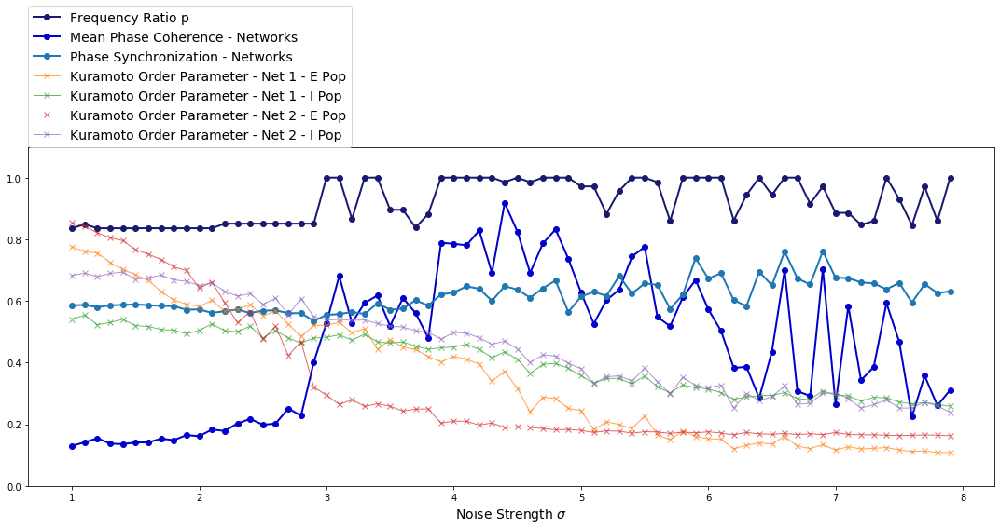

In [8]:
import pprint

plots.plot_exploration(ex, vmin_ratio=None, vmin_phase=None, vmax_phase=None, folder="PING_sparse")
pprint.pprint(ex.default_params)

INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_sparse.h5 opened for reading.


Global Order Parameter value of: 0.5888209853138631
Mean Phase Coherence 0.14126178680525153
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.4726593794545414
Within Synchronization of Network 2 0.5619276294739142


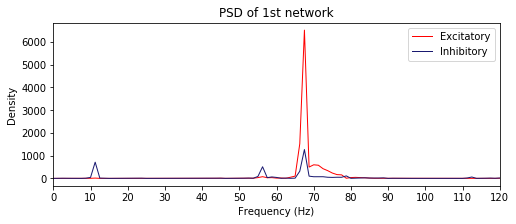

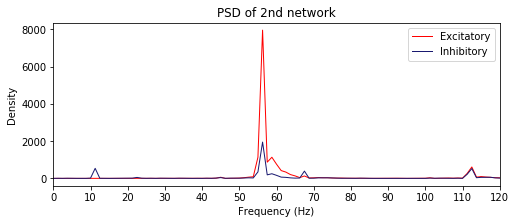

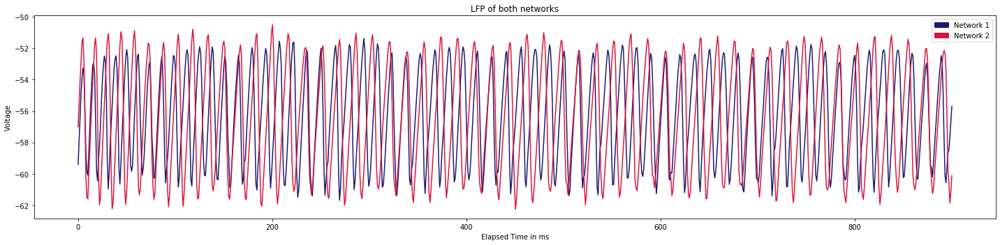

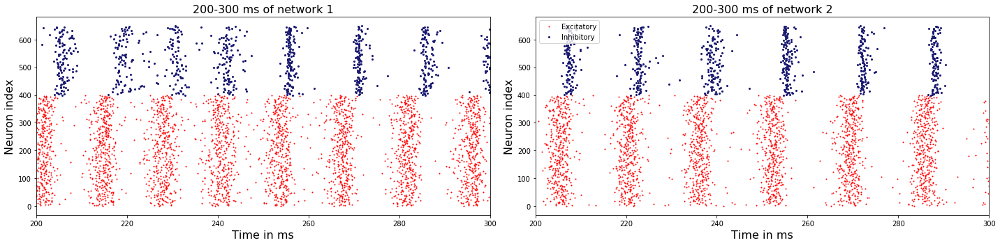

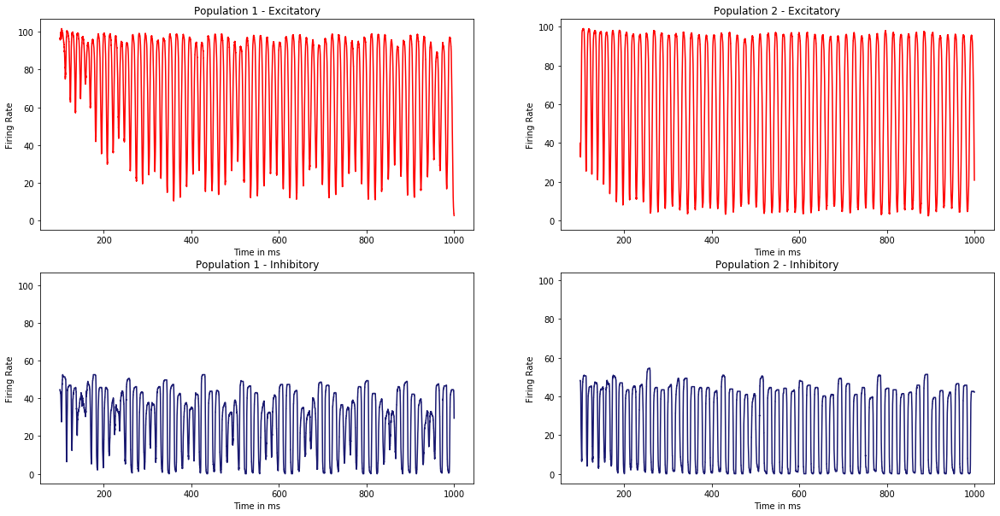

...

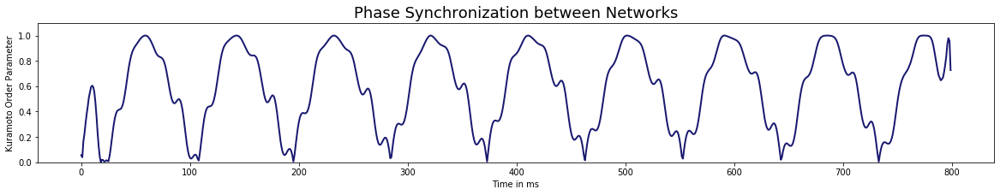

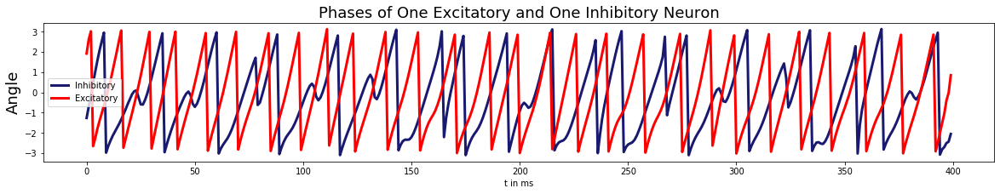

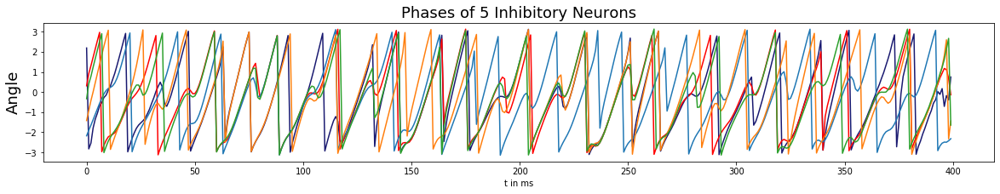

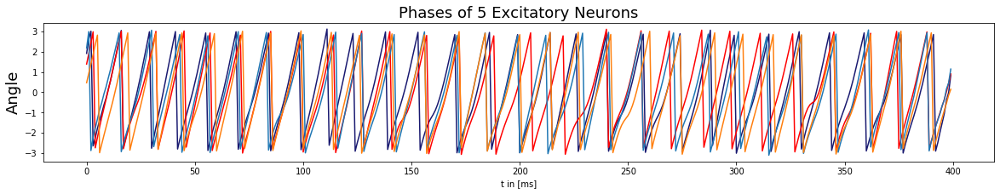

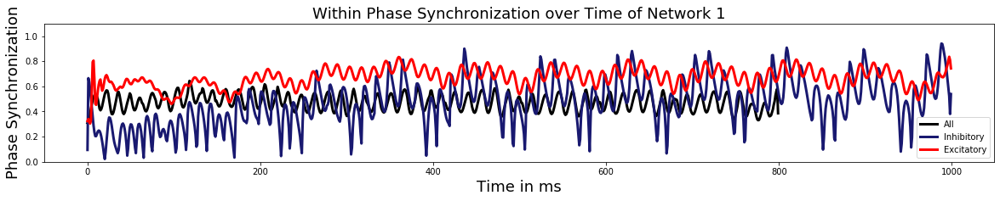

In [225]:
plots.plot_results(ex.get_run(5))

In [226]:
print(ex.params[5])
ex.default_params

{'poisson_variance': 1.5000000000000004}


{'runtime': 1000.0,
 'J_itoi': 0.7,
 'J_etoe': 0.01,
 'J_etoi': 0.05,
 'J_itoe': 0.5,
 'J_ppee': 0.001,
 'J_ppei': 0.03,
 'p_ppee': 0.0,
 'p_ppei': 0.4,
 'p_ppii': 0.0,
 'p_etoi': 0.4,
 'p_etoe': 0.2,
 'p_itoe': 0.4,
 'p_itoi': 0.4,
 'ou_enabled': [False, False],
 'poisson_enabled': [True, True],
 'poisson_variance': 1.0,
 'poisson_p': 0.84,
 'poisson_size': 800,
 'poisson_mean_input': 300,
 'N_pop': 2,
 'net_record_spikes': 400,
 'poisson_I_ratio': 0.4,
 'poisson_I_enabled': True,
 'const_delay': 0.0}

## Noise strength and ratio - Exploration

In [3]:
exp_params = {
    "poisson_variance": np.arange(0.5, 10.0, 0.5),
    "poisson_p": np.arange(0.7, 1.0, 0.05),
}

ov_params = dict(params)
ov_params.update({
    "runtime": 1000
})

ex = mopet.Exploration(
    runner.run_in_mopet, 
    explore_params=exp_params, 
    default_params=ov_params,
    hdf_filename=constants.MODELS_PATH + "/PING_sparse_2d.h5",
    exploration_name="exp_2"
)

In [228]:
ex.run()

2020-07-23 11:20:15,725	INFO resource_spec.py:212 -- Starting Ray with 10.99 GiB memory available for workers and up to 5.51 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-07-23 11:20:15,976	WARNING services.py:923 -- Redis failed to start, retrying now.
2020-07-23 11:20:16,150	INFO services.py:1165 -- View the Ray dashboard at localhost:8265
INFO:root:Starting 133 jobs.
100%|██████████| 133/133 [00:00<00:00, 561.44it/s]
INFO:root:Runs took 0.23984098434448242 s to submit.
  0%|          | 0/133 [00:00<?, ?it/s]

(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) 0.6495 s (64%) simulated in 10s, estimated 5s remaining.
(pid=8077) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=8077) 1. s (100%) simulated in 13s
(pid=8069) 0.7924 s (79%) simulated in 10s, estimated 3s remaining.
(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) 1. s (100%) simulated in 12s
(pid=8069) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) Starting simulation at t=0. s for a duration of 1

  2%|▏         | 2/133 [00:59<1:30:32, 41.47s/it]

(pid=8070) 1. s (100%) simulated in 24s
(pid=8070) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=8068) 1. s (100%) simulated in 24s
(pid=8068) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8071) 0.81815 s (81%) simulated in 20s, estimated 4s remaining.
(pid=8073) 1. s (100%) simulated in 25s
(pid=8073) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8074) 0.76875 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8071) 1. s (100%) simulated in 24s
(pid=8071) INFO       width adjusted from 10. ms to 10.05 ms [brian2.monitors.ratemonitor.adjusted_width]
(pid=8075) 0.3948 s (39%) simulated in 10s, estimated 15s remaining.
(pid=8072) Starti

  3%|▎         | 4/133 [01:11<49:15, 22.91s/it]  

(pid=8078) 0.38695 s (38%) simulated in 10s, estimated 16s remaining.


  8%|▊         | 11/133 [01:12<04:12,  2.07s/it]

(pid=8067) 0.38915 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8077) 0.3908 s (39%) simulated in 10s, estimated 16s remaining.


 11%|█         | 14/133 [01:16<02:24,  1.21s/it]

(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8070) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) 0.77595 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8068) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 0.37565 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8076) 0.3689 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8073) 0.3698 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8078) 0.75445 s (75%) simulated in 20s, estimated 7s remaining.
(pid=8071) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) 0.75175 s (75%) simulated in 20s, estimated 7s remaining.
(pid=8077) 0.75095 s (75%) simulated in 20s, estimated 7s remaining.
(pid=8075) 1. s (100%) simulated in 26s
(pid=8074) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) 0.36445 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8070) 0.36525 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8068) 0.360

 12%|█▏        | 16/133 [01:34<08:55,  4.57s/it]

(pid=8072) 1. s (100%) simulated in 27s
(pid=8074) 0.363 s (36%) simulated in 10s, estimated 18s remaining.
(pid=8076) 1. s (100%) simulated in 27s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) 0.73745 s (73%) simulated in 20s, estimated 7s remaining.
(pid=8073) 1. s (100%) simulated in 27s
(pid=8070) 0.74295 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) 0.7408 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) 0.38225 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8071) 0.75385 s (75%) simulated in 20s, estimated 7s remaining.
(pid=8072) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) 1. s (100%) simulated in 26s
(pid=8070) 1. s (100%) simulated in 26s
(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pi

 15%|█▌        | 20/133 [01:48<04:52,  2.59s/it]

(pid=8071) 1. s (100%) simulated in 26s


 18%|█▊        | 24/133 [01:49<01:24,  1.29it/s]

(pid=8077) 0.3778 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8070) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) 0.7609 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8074) 1. s (100%) simulated in 26s
(pid=8072) 0.384 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8076) 0.375 s (37%) simulated in 10s, estimated 17s remaining.


 19%|█▉        | 25/133 [01:53<03:09,  1.76s/it]

(pid=8073) 0.36335 s (36%) simulated in 10s, estimated 18s remaining.
(pid=8078) 0.763 s (76%) simulated in 20s, estimated 6s remaining.


 20%|█▉        | 26/133 [01:57<04:01,  2.26s/it]

(pid=8067) 0.7701 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8075) 1. s (100%) simulated in 26s
(pid=8077) 0.7626 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8070) 0.39365 s (39%) simulated in 10s, estimated 15s remaining.
(pid=8078) 1. s (100%) simulated in 25s


 20%|██        | 27/133 [02:02<05:38,  3.19s/it]

(pid=8072) 0.77795 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8067) 1. s (100%) simulated in 25s
(pid=8076) 0.7596 s (75%) simulated in 20s, estimated 6s remaining.
(pid=8073) 0.74885 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8068) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8074) Starting simulation at t=0. s for a duration of 1. s


 21%|██        | 28/133 [02:07<06:20,  3.62s/it]

(pid=8077) 1. s (100%) simulated in 26s


 22%|██▏       | 29/133 [02:07<04:42,  2.72s/it]

(pid=8071) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 1. s (100%) simulated in 25s
(pid=8076) 1. s (100%) simulated in 26s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8073) 1. s (100%) simulated in 26s
(pid=8070) 0.7688 s (76%) simulated in 20s, estimated 6s remaining.


 24%|██▍       | 32/133 [02:14<03:40,  2.18s/it]

(pid=8068) 0.37825 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8069) 0.37435 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8075) 0.37935 s (37%) simulated in 10s, estimated 16s remaining.


 25%|██▍       | 33/133 [02:15<03:06,  1.86s/it]

(pid=8072) Starting simulation at t=0. s for a duration of 1. s
(pid=8074) 0.37895 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8070) 1. s (100%) simulated in 25s
(pid=8071) 0.38465 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8078) 0.39025 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8068) 0.77825 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8069) 0.77475 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8075) 0.786 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 0.41245 s (41%) simulated in 10s, estimated 14s remaining.
(pid=8074) 0.78475 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8076) 0.4095 s (40%) simulated in 10s, estimated 14s remaining.
(pid=8067) 0.4096 s (40%) simulated in 10s, estimated 14s remaining.
(pid=8071) 0

 27%|██▋       | 36/133 [02:35<05:44,  3.56s/it]

(pid=8073) 0.41475 s (41%) simulated in 10s, estimated 14s remaining.
(pid=8072) 0.84365 s (84%) simulated in 20s, estimated 4s remaining.


 28%|██▊       | 37/133 [02:36<04:48,  3.01s/it]

(pid=8068) Starting simulation at t=0. s for a duration of 1. s


 29%|██▊       | 38/133 [02:37<03:24,  2.15s/it]

(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) 0.82265 s (82%) simulated in 20s, estimated 4s remaining.
(pid=8067) 0.8295 s (82%) simulated in 20s, estimated 4s remaining.


 29%|██▉       | 39/133 [02:37<02:26,  1.56s/it]

(pid=8069) Starting simulation at t=0. s for a duration of 1. s


 30%|███       | 40/133 [02:39<02:33,  1.65s/it]

(pid=8072) 1. s (100%) simulated in 23s
(pid=8067) 1. s (100%) simulated in 24s
(pid=8076) 1. s (100%) simulated in 24s
(pid=8077) 0.3914 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8070) 0.39205 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8073) 0.8114 s (81%) simulated in 20s, estimated 5s remaining.


 31%|███       | 41/133 [02:45<04:52,  3.18s/it]

(pid=8068) 0.39645 s (39%) simulated in 10s, estimated 15s remaining.
(pid=8075) 0.3908 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8072) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) 0.3918 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8073) 1. s (100%) simulated in 25s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) 0.78355 s (78%) simulated in 20s, estimated 6s remaining.
(pid=8070) 0.7893 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8074) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) 0.79115 s (79%) simulated in 20s, estimated 5s remaining.
(pid=8075) 0.7819 s (78%) simulated in 20s, estimated 6s remaining.
(pid=8072) 0.39095 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8069) 0.7819 s (78%) simulated in 20s, estimated 6s remaining.
(pid=8077) 1. s (100

 32%|███▏      | 43/133 [03:03<07:47,  5.19s/it]

(pid=8075) 1. s (100%) simulated in 25s


 34%|███▍      | 45/133 [03:03<03:52,  2.64s/it]

(pid=8069) 1. s (100%) simulated in 25s


 35%|███▍      | 46/133 [03:04<03:16,  2.26s/it]

(pid=8074) 0.36065 s (36%) simulated in 10s, estimated 18s remaining.
(pid=8072) 0.75955 s (75%) simulated in 20s, estimated 6s remaining.


 37%|███▋      | 49/133 [03:08<01:52,  1.34s/it]

(pid=8070) Starting simulation at t=0. s for a duration of 1. s
(pid=8073) 0.36085 s (36%) simulated in 10s, estimated 18s remaining.
(pid=8076) 0.76035 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8067) 0.7594 s (75%) simulated in 20s, estimated 6s remaining.
(pid=8071) 0.36625 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) 0.74555 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8072) 1. s (100%) simulated in 26s
(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) 1. s (100%) simulated in 26s
(pid=8067) 1. s (100%) simulated in 26s
(pid=8074) 0.74255 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8070) 0.38885 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8073) 0.74275 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8

 38%|███▊      | 50/133 [03:26<09:05,  6.57s/it]

(pid=8070) 0.7952 s (79%) simulated in 20s, estimated 5s remaining.


 42%|████▏     | 56/133 [03:30<01:21,  1.06s/it]

(pid=8072) 0.40425 s (40%) simulated in 10s, estimated 15s remaining.
(pid=8075) 0.7918 s (79%) simulated in 20s, estimated 5s remaining.
(pid=8068) 0.8 s (80%) simulated in 20s, estimated 5s remaining.
(pid=8069) 0.7939 s (79%) simulated in 20s, estimated 5s remaining.
(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) 0.3963 s (39%) simulated in 10s, estimated 15s remaining.
(pid=8067) 0.4014 s (40%) simulated in 10s, estimated 15s remaining.
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8070) 1. s (100%) simulated in 25s
(pid=8077) 0.80275 s (80%) simulated in 20s, estimated 5s remaining.
(pid=8068) 1. s (100%) simulated in 24s
(pid=8075) 1. s (100%) simulated in 25s
(pid=8069) 1. s (100%) simulated in 25s
(pid=8077) 1. s (100%) simulated in 24s
(pid=8071) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 0.8161 s (81%) simulated in 20s, estimated 5s remaining.
(pid=8070) Starting simulation at t=0. s for a duration of 1. 

 44%|████▍     | 59/133 [03:43<02:49,  2.30s/it]

(pid=8074) Starting simulation at t=0. s for a duration of 1. s


 46%|████▌     | 61/133 [03:43<01:28,  1.23s/it]

(pid=8072) 1. s (100%) simulated in 24s
(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) 1. s (100%) simulated in 25s
(pid=8076) 1. s (100%) simulated in 25s
(pid=8071) 0.37055 s (37%) simulated in 10s, estimated 17s remaining.


 47%|████▋     | 62/133 [03:50<03:13,  2.72s/it]

(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8070) 0.37375 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8073) 0.7637 s (76%) simulated in 20s, estimated 6s remaining.


 48%|████▊     | 64/133 [03:52<02:03,  1.79s/it]

(pid=8078) 0.77535 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8068) 0.36965 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8075) 0.36585 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8072) Starting simulation at t=0. s for a duration of 1. s
(pid=8074) 0.37225 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) 0.37005 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8078) 1. s (100%) simulated in 25s
(pid=8073) 1. s (100%) simulated in 26s
(pid=8071) 0.7455 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8069) 0.3754 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8070) 0.7531 s (75%) simulated in 20s, estimated 7s remaining.
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) 0.7513 s (75%) simulated in 20s, estimated 7s remaining.


 49%|████▉     | 65/133 [04:02<05:05,  4.50s/it]

(pid=8075) 0.7492 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8072) 0.38355 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8074) 0.74795 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8076) 0.37655 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8071) 1. s (100%) simulated in 26s
(pid=8077) 0.7491 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8070) 1. s (100%) simulated in 26s
(pid=8068) 1. s (100%) simulated in 26s
(pid=8075) 1. s (100%) simulated in 26s
(pid=8069) 0.75565 s (75%) simulated in 20s, estimated 6s remaining.
(pid=8074) 1. s (100%) simulated in 26s
(pid=8067) 0.36985 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8072) 0.76055 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8077) 1. s (100%) simulated in 26s
(pid=8076) 0.7465 s (74%) simulated in 20s, estimated 7s remaining.


 50%|█████     | 67/133 [04:15<05:23,  4.90s/it]

(pid=8073) 0.3573 s (35%) simulated in 10s, estimated 18s remaining.


 52%|█████▏    | 69/133 [04:16<02:40,  2.50s/it]

(pid=8078) 0.361 s (36%) simulated in 10s, estimated 18s remaining.


 53%|█████▎    | 71/133 [04:16<01:22,  1.33s/it]

(pid=8069) 1. s (100%) simulated in 26s
(pid=8068) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 1. s (100%) simulated in 26s
(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) 1. s (100%) simulated in 26s


 55%|█████▍    | 73/133 [04:22<01:49,  1.82s/it]

(pid=8067) 0.73615 s (73%) simulated in 20s, estimated 7s remaining.
(pid=8070) Starting simulation at t=0. s for a duration of 1. s


 56%|█████▌    | 74/133 [04:24<01:55,  1.96s/it]

(pid=8073) 0.72695 s (72%) simulated in 20s, estimated 8s remaining.
(pid=8078) 0.7417 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8072) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) 0.38395 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8075) 0.3811 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) 1. s (100%) simulated in 26s
(pid=8071) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) 0.40515 s (40%) simulated in 10s, estimated 15s remaining.
(pid=8073) 1. s (100%) simulated in 26s
(pid=8078) 1. s (100%) simulated in 26s
(pid=8070) 0.4069 s (40%) simulated in 10s, estimated 15s remaining.


 57%|█████▋    | 76/133 [04:33<02:41,  2.83s/it]

(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8074) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) Starting simulation at t=0. s for a duration of 1. s


 59%|█████▊    | 78/133 [04:37<02:03,  2.24s/it]

(pid=8072) 0.41235 s (41%) simulated in 10s, estimated 14s remaining.
(pid=8075) 0.79045 s (79%) simulated in 20s, estimated 5s remaining.
(pid=8068) 0.78885 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8076) 0.4032 s (40%) simulated in 10s, estimated 15s remaining.
(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8071) 0.3898 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8077) 0.7971 s (79%) simulated in 20s, estimated 5s remaining.
(pid=8075) 1. s (100%) simulated in 25s
(pid=8070) 0.8023 s (80%) simulated in 20s, estimated 5s remaining.
(pid=8068) 1. s (100%) simulated in 25s
(pid=8069) 0.3945 s (39%) simulated in 10s, estimated 15s remaining.
(pid=8074) 0.38675 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8067) 0.39675 s (39%) simulated in 10s, estimated 15s remaining.
(pid=8077) 1. s (100%) simulated in 25s
(pid=8072) 0.81425 s (81%) simulated in 20s, estimated 5s rem

 60%|██████    | 80/133 [05:01<05:28,  6.19s/it]

(pid=8070) Starting simulation at t=0. s for a duration of 1. s


 62%|██████▏   | 82/133 [05:01<02:41,  3.16s/it]

(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) 0.3891 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8078) 1. s (100%) simulated in 25s


 62%|██████▏   | 83/133 [05:05<02:41,  3.23s/it]

(pid=8073) 1. s (100%) simulated in 25s


 66%|██████▌   | 88/133 [05:06<00:31,  1.44it/s]

(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 0.387 s (38%) simulated in 10s, estimated 16s remaining.


 68%|██████▊   | 90/133 [05:10<00:51,  1.19s/it]

(pid=8068) 0.7863 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8070) 0.3893 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) 0.3786 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8077) 0.77 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8074) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) 1. s (100%) simulated in 25s
(pid=8069) 0.37995 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8067) 0.38165 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8076) 0.3766 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8071) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 0.77125 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8077) 1. s (100%) simulated in 25s
(pid=8070) 0.7673 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8073) 0.37085 s (37%) simulated in 10s, e

 68%|██████▊   | 91/133 [05:34<05:39,  8.08s/it]

(pid=8077) Starting simulation at t=0. s for a duration of 1. s


 70%|██████▉   | 93/133 [05:34<02:41,  4.05s/it]

(pid=8076) 1. s (100%) simulated in 26s


 71%|███████▏  | 95/133 [05:34<01:19,  2.08s/it]

(pid=8074) 0.7618 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8071) 0.7707 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8078) 1. s (100%) simulated in 25s
(pid=8073) 1. s (100%) simulated in 26s


 72%|███████▏  | 96/133 [05:39<01:42,  2.76s/it]

(pid=8068) 0.3842 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8074) 1. s (100%) simulated in 26s
(pid=8072) 0.3859 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8071) 1. s (100%) simulated in 25s
(pid=8077) 0.38765 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8078) Starting simulation at t=0. s for a duration of 1. s
(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pid=8075) 0.3911 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8069) Starting simulation at t=0. s for a duration of 1. s


 74%|███████▍  | 99/133 [05:49<01:23,  2.46s/it]

(pid=8070) Starting simulation at t=0. s for a duration of 1. s


 77%|███████▋  | 102/133 [05:50<00:31,  1.00s/it]

(pid=8068) 0.77115 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8067) 0.3833 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8072) 0.7699 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8076) 0.37865 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8077) 0.76255 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8068) 1. s (100%) simulated in 26s
(pid=8078) 0.37485 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8073) 0.36355 s (36%) simulated in 10s, estimated 18s remaining.
(pid=8075) 0.771 s (77%) simulated in 20s, estimated 6s remaining.
(pid=8069) 0.36955 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8072) 1. s (100%) simulated in 26s
(pid=8070) 0.37795 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8071) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) 1. s (100%) simulated in 26s


 77%|███████▋  | 103/133 [06:00<01:57,  3.93s/it]

(pid=8067) 0.76585 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8076) 0.76 s (76%) simulated in 20s, estimated 6s remaining.
(pid=8075) 1. s (100%) simulated in 25s
(pid=8074) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) Starting simulation at t=0. s for a duration of 1. s


 79%|███████▉  | 105/133 [06:05<01:22,  2.95s/it]

(pid=8078) 0.7526 s (75%) simulated in 20s, estimated 7s remaining.
(pid=8073) 0.73125 s (73%) simulated in 20s, estimated 7s remaining.
(pid=8067) 1. s (100%) simulated in 26s
(pid=8069) 0.7451 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8076) 1. s (100%) simulated in 26s
(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8070) 0.74885 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8071) 0.36915 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) 1. s (100%) simulated in 26s
(pid=8073) 1. s (100%) simulated in 27s
(pid=8074) 0.3538 s (35%) simulated in 10s, estimated 18s remaining.
(pid=8069) 1. s (100%) simulated in 26s
(pid=8072) 0.3646 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8070) 1. s (100%) simulated in 26s
(pid=8077) 0.36525 s (36%) simulated in 10s, estimated 17s remaining.
(pid=8071) 0.741

 80%|███████▉  | 106/133 [06:21<03:01,  6.72s/it]

(pid=8078) Starting simulation at t=0. s for a duration of 1. s


 81%|████████  | 108/133 [06:21<01:24,  3.39s/it]

(pid=8073) Starting simulation at t=0. s for a duration of 1. s


 84%|████████▍ | 112/133 [06:22<00:20,  1.02it/s]

(pid=8069) Starting simulation at t=0. s for a duration of 1. s
(pid=8067) Starting simulation at t=0. s for a duration of 1. s
(pid=8076) Starting simulation at t=0. s for a duration of 1. s
(pid=8074) 0.71795 s (71%) simulated in 20s, estimated 8s remaining.
(pid=8072) 0.73755 s (73%) simulated in 20s, estimated 7s remaining.
(pid=8071) 1. s (100%) simulated in 26s
(pid=8070) Starting simulation at t=0. s for a duration of 1. s
(pid=8077) 0.74275 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8075) 0.7421 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8068) 0.7438 s (74%) simulated in 20s, estimated 7s remaining.
(pid=8078) 0.378 s (37%) simulated in 10s, estimated 16s remaining.
(pid=8073) 0.3763 s (37%) simulated in 10s, estimated 17s remaining.
(pid=8074) 1. s (100%) simulated in 27s
(pid=8072) 1. s (100%) simulated in 26s
(pid=8069) 0.3812 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8067) 0.38785 s (38%) simulated in 10s, estimated 16s remaining.
(pid=

 86%|████████▌ | 114/133 [06:36<01:06,  3.48s/it]

(pid=8075) 1. s (100%) simulated in 26s
(pid=8068) 1. s (100%) simulated in 26s
(pid=8070) 0.3925 s (39%) simulated in 10s, estimated 15s remaining.
(pid=8072) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) 0.78465 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8073) 0.7749 s (77%) simulated in 20s, estimated 6s remaining.


 89%|████████▊ | 118/133 [06:42<00:22,  1.49s/it]

(pid=8077) Starting simulation at t=0. s for a duration of 1. s
(pid=8069) 0.78155 s (78%) simulated in 20s, estimated 6s remaining.
(pid=8067) 0.78625 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8076) 0.7851 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8075) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) Starting simulation at t=0. s for a duration of 1. s
(pid=8078) 1. s (100%) simulated in 25s
(pid=8073) 1. s (100%) simulated in 25s
(pid=8070) 0.7886 s (78%) simulated in 20s, estimated 5s remaining.
(pid=8069) 1. s (100%) simulated in 25s
(pid=8067) 1. s (100%) simulated in 25s
(pid=8071) Starting simulation at t=0. s for a duration of 1. s
(pid=8072) 0.3911 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8076) 1. s (100%) simulated in 25s
(pid=8077) 0.39005 s (39%) simulated in 10s, estimated 16s remaining.
(pid=8074) Starting simulation at t=0. s for a duration of 1. s


 89%|████████▉ | 119/133 [06:52<00:59,  4.22s/it]

(pid=8070) 1. s (100%) simulated in 25s
(pid=8078) Starting simulation at t=0. s for a duration of 1. s


 91%|█████████ | 121/133 [06:54<00:28,  2.37s/it]

(pid=8075) 0.39185 s (39%) simulated in 10s, estimated 16s remaining.


 92%|█████████▏| 123/133 [06:54<00:12,  1.26s/it]

(pid=8073) Starting simulation at t=0. s for a duration of 1. s
(pid=8068) 0.38955 s (38%) simulated in 10s, estimated 16s remaining.
(pid=8069) Starting simulation at t=0. s for a duration of 1. s


 93%|█████████▎| 124/133 [06:57<00:15,  1.75s/it]

(pid=8071) 0.4079 s (40%) simulated in 10s, estimated 15s remaining.
(pid=8072) 0.8263 s (82%) simulated in 20s, estimated 4s remaining.
(pid=8077) 0.84155 s (84%) simulated in 20s, estimated 4s remaining.
(pid=8072) 1. s (100%) simulated in 23s
(pid=8074) 0.4391 s (43%) simulated in 10s, estimated 13s remaining.
(pid=8078) 0.4482 s (44%) simulated in 10s, estimated 12s remaining.
(pid=8075) 0.8566 s (85%) simulated in 20s, estimated 3s remaining.
(pid=8073) 0.44865 s (44%) simulated in 10s, estimated 12s remaining.
(pid=8069) 0.47245 s (47%) simulated in 10s, estimated 11s remaining.
(pid=8068) 0.85645 s (85%) simulated in 20s, estimated 3s remaining.
(pid=8077) 1. s (100%) simulated in 23s
(pid=8075) 1. s (100%) simulated in 22s
(pid=8068) 1. s (100%) simulated in 22s
(pid=8071) 0.9055 s (90%) simulated in 20s, estimated 2s remaining.
(pid=8071) 1. s (100%) simulated in 21s


 94%|█████████▍| 125/133 [07:12<00:44,  5.61s/it]

(pid=8074) 1. s (100%) simulated in 19s
(pid=8078) 1. s (100%) simulated in 18s
(pid=8069) 1. s (100%) simulated in 17s
(pid=8073) 1. s (100%) simulated in 18s


100%|██████████| 133/133 [07:15<00:00,  3.27s/it]
INFO:root:Runs and storage took 435.41161584854126 s to complete.


In [4]:
ex.load_results(all=True)

INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_sparse_2d.h5 opened for reading.
INFO:root:Gettings runs of exploration ``exp_2``
100%|██████████| 133/133 [00:15<00:00,  8.71it/s]
INFO:root:Creating new results DataFrame
INFO:root:Aggregating scalar results ...
100%|██████████| 133/133 [00:17<00:00,  7.46it/s]
INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_sparse_2d.h5 closed.


### Results

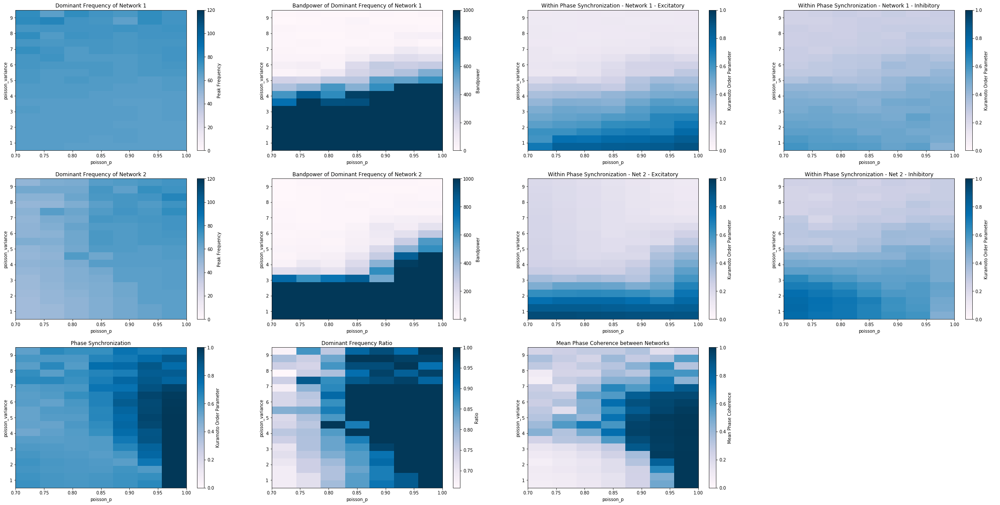

In [230]:
plots.plot_exploration(ex, vmin_ratio=None)

(<Figure size 1224x1440 with 12 Axes>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x11c4dfe10>,
       dtype=object))

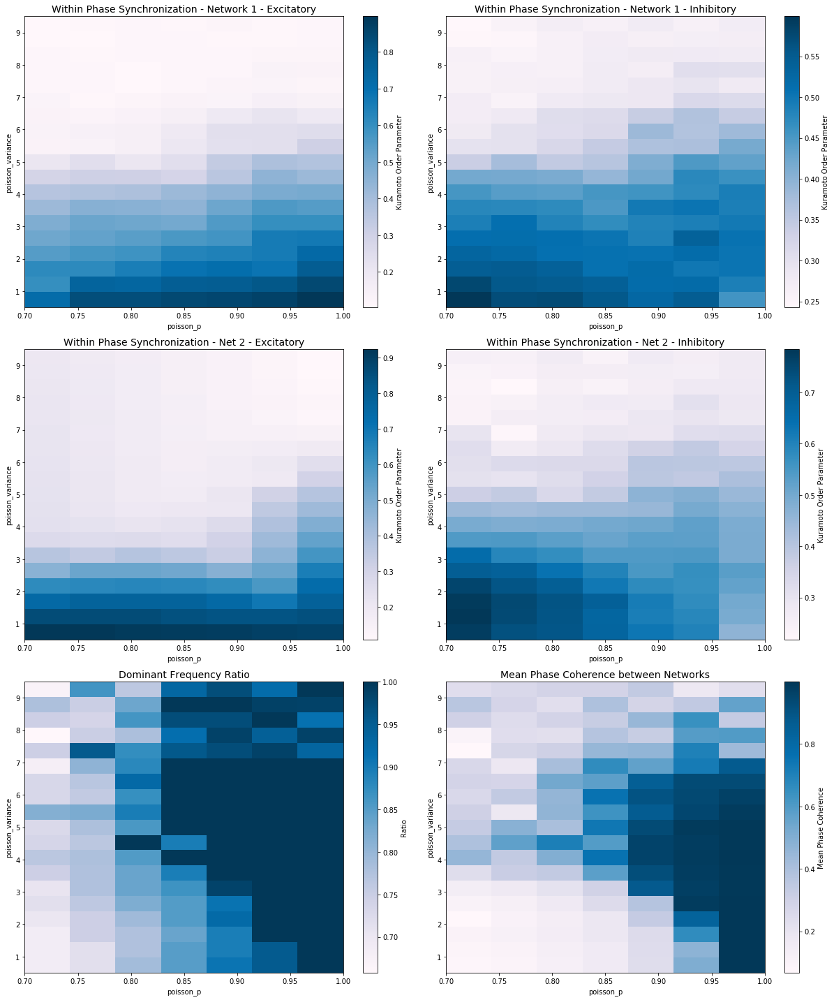

In [6]:
plots.plot_exp_figure(ex, vmin_ratio=None, vmin_phase=None, vmax_phase=None, filename="PING_sparse_exp")

INFO:root:/Users/lrebscher/git/Synchronization-by-Uncorrelated-Noise/models/PING_sparse_2d.h5 opened for reading.


{'poisson_p': 0.8, 'poisson_variance': 8.5}
Global Order Parameter value of: 0.5633943464509131
Mean Phase Coherence 0.2886865145361896
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.12580494185094324
Within Synchronization of Network 2 0.17178079834741702


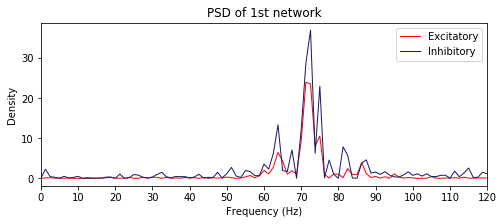

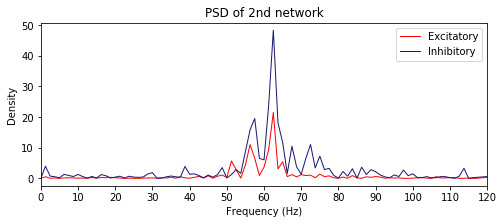

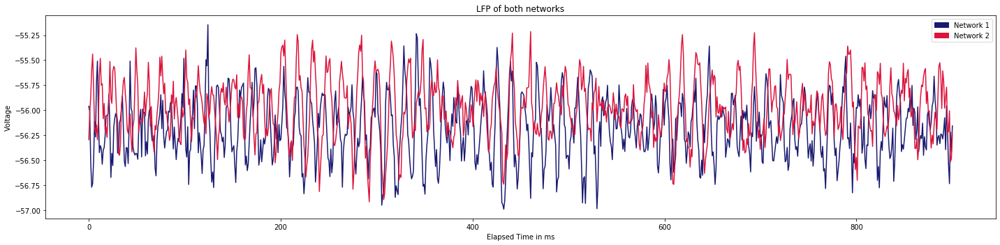

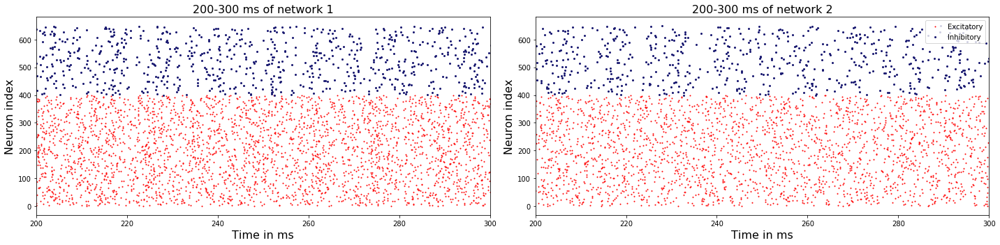

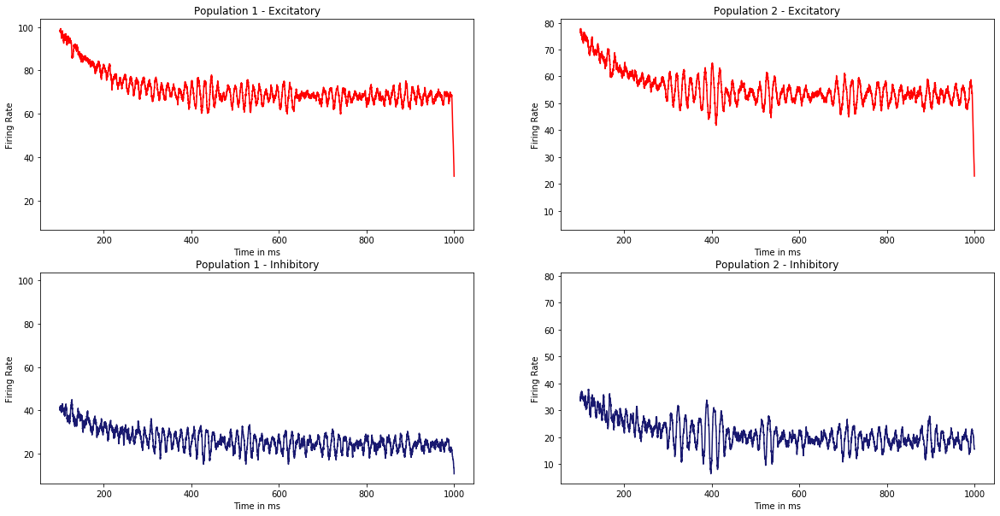

...

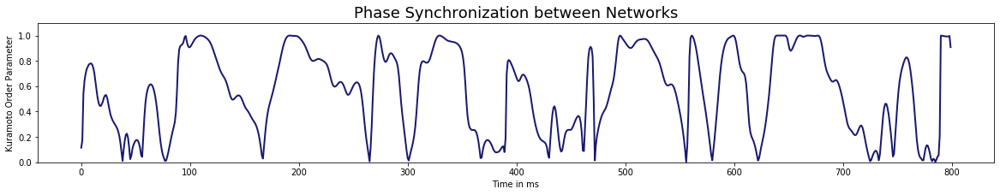

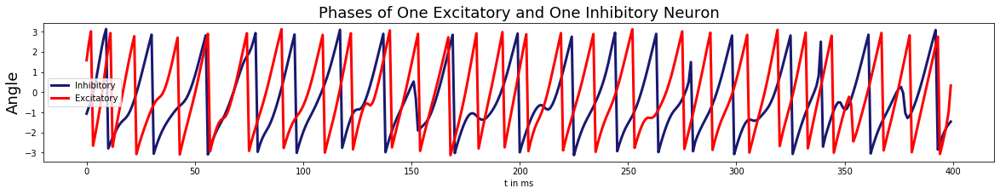

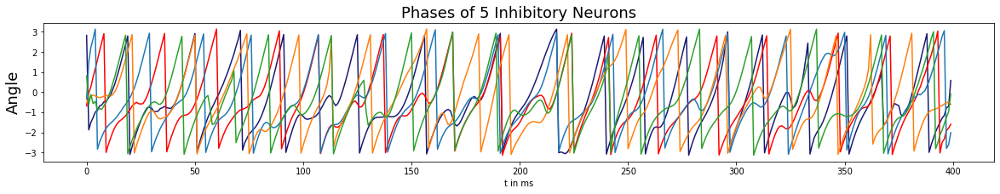

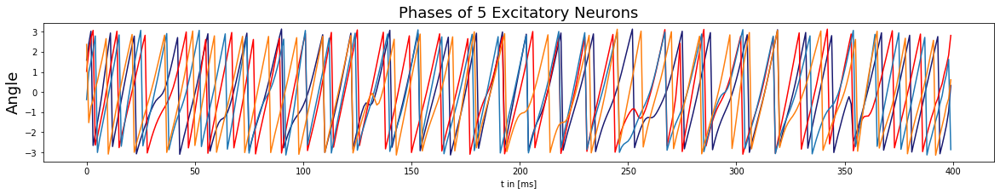

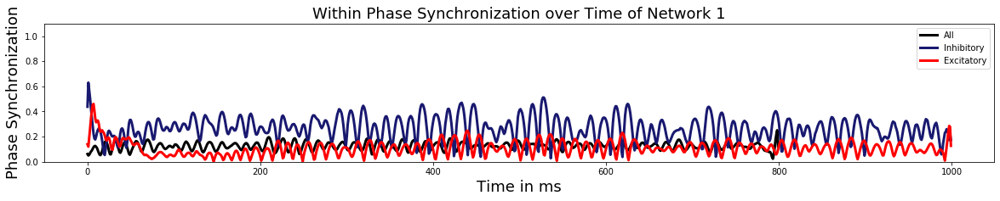

In [232]:
print(ex.params[114])
plots.plot_results(ex.get_run(114))

{'poisson_p': 0.8500000000000001, 'poisson_variance': 5.0}
Global Order Parameter value of: 0.6619951297622423
Mean Phase Coherence 0.7406000272830715
Computing within synchronization for network 1 and 2
Within Synchronization of Network 1 0.16317715131269173
Within Synchronization of Network 2 0.1723630736647322


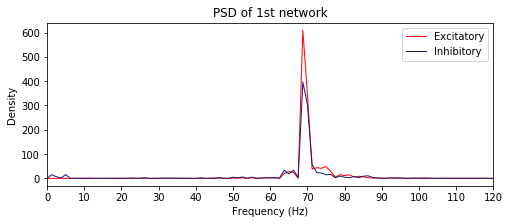

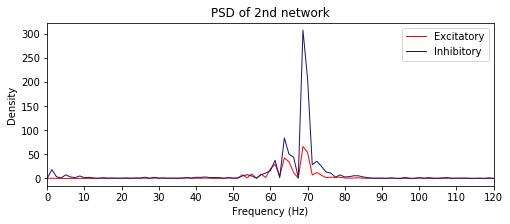

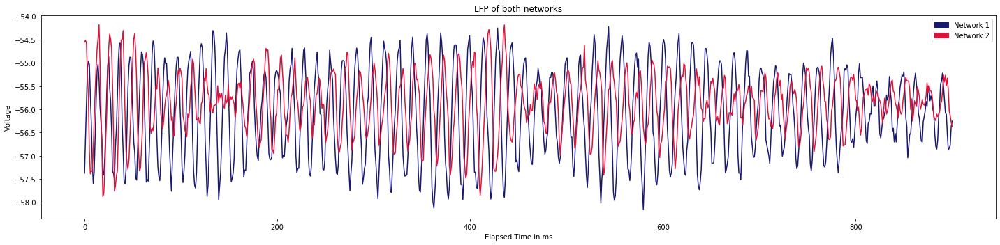

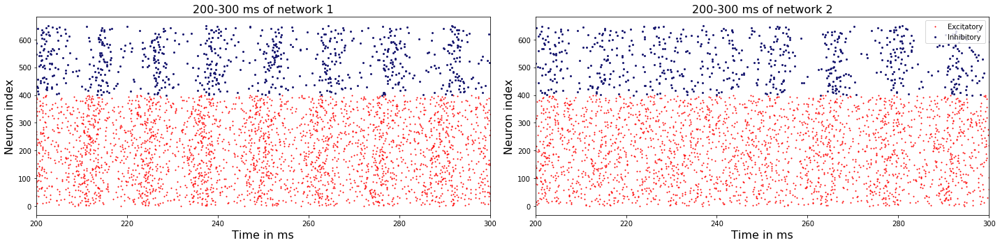

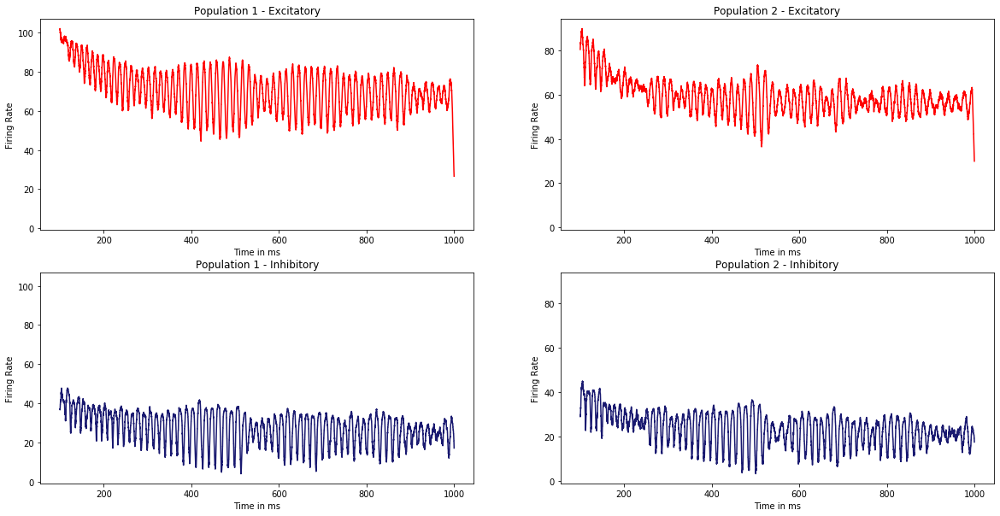

...

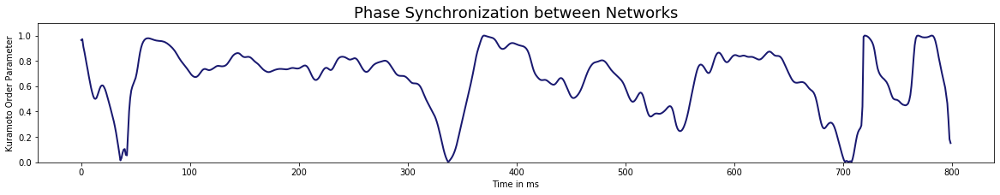

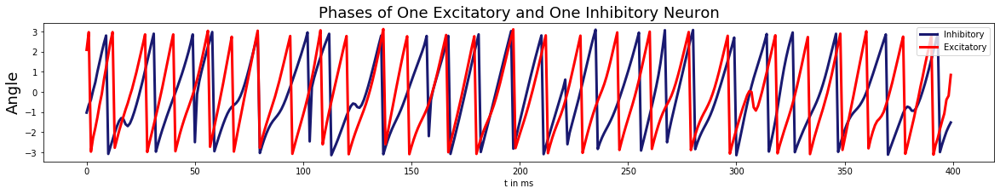

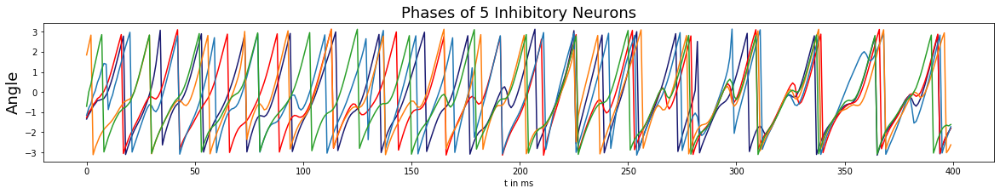

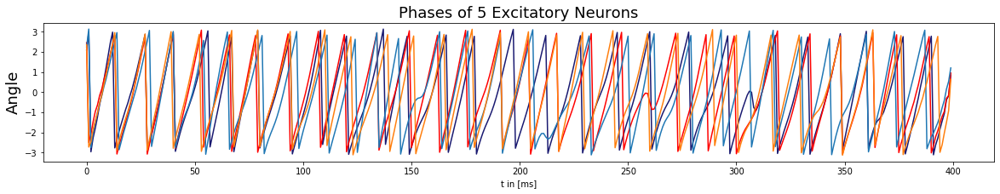

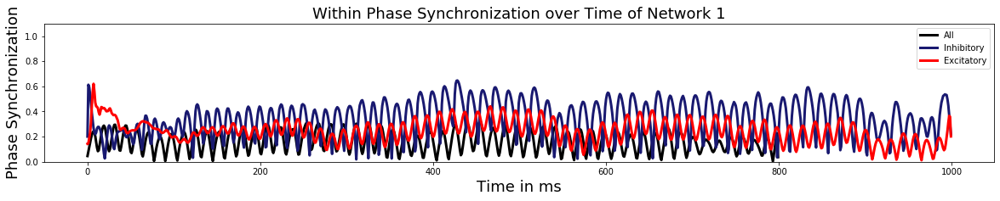

In [233]:
print(ex.params[66])
plots.plot_results(ex.get_run(66))